# Protein ligand simulation protocol (Statistical analysis)
# C-termini

## By: Edward Francisco Méndez-Otálvaro
### Advisors: Dr. Daniel Barragán-Ramírez & Dr. Isaías Lans-Vargas

### Importing packages (Analysis & Visualization)

In [1]:
import sklearn
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
from statsmodels.stats.libqsturng import qsturng, psturng

In [2]:
##Function to boostraping (empirical bootstraping)

from tqdm import tqdm

def estadistico_media(X):
    
    estadistico=np.mean(X)
    return(estadistico)

def boostraping_media(X,fun_estadistico,n_iteraciones=100000):
    
    n=len(X)
    stadistico_muestra=fun_estadistico(X)
    dist_boot=np.full(shape=n_iteraciones,fill_value=np.nan)
    
    for i in tqdm(range(n_iteraciones)):
        resample=np.random.choice(X,size=n,replace=True)
        dist_boot[i]=fun_estadistico(resample)-stadistico_muestra
        #dist_boot[i]=fun_estadistico(resample)-stadistico_muestra

    return dist_boot

In [3]:
import scipy.stats as stats

def Confidence_Intervals(X,Y):
##IC Bootstraping empírico
    #cuantiles=np.quantile(a=X,q=[0.025,0.975])
    cuantiles=np.quantile(a=X,q=[0.025,0.975])
    stadistico_muestra=estadistico_media(Y)
    intervalo=[stadistico_muestra-cuantiles[1],stadistico_muestra-cuantiles[0]]
    return intervalo

### Calling datasets

In [4]:
##Total
xtal_t=pd.read_csv('dG_total_xtal.csv',index_col=None)
xtal_t.drop('Unnamed: 0',inplace=True,axis=1)
decoy_t=pd.read_csv('dG_total_decoy.csv',index_col=None)
decoy_t.drop('Unnamed: 0',inplace=True,axis=1)
lig1_t=pd.read_csv('dG_total_lig1.csv',index_col=None)
lig1_t.drop('Unnamed: 0',inplace=True,axis=1)
lig2_t=pd.read_csv('dG_total_lig2.csv',index_col=None)
lig2_t.drop('Unnamed: 0',inplace=True,axis=1)
lig3_t=pd.read_csv('dG_total_lig3.csv',index_col=None)
lig3_t.drop('Unnamed: 0',inplace=True,axis=1)

##Parcial
xtal_p=pd.read_csv('dG_parcial_xtal.csv',index_col=None)
xtal_p.drop('Unnamed: 0',inplace=True,axis=1)
decoy_p=pd.read_csv('dG_parcial_decoy.csv',index_col=None)
decoy_p.drop('Unnamed: 0',inplace=True,axis=1)
lig1_p=pd.read_csv('dG_parcial_lig1.csv',index_col=None)
lig1_p.drop('Unnamed: 0',inplace=True,axis=1)
lig2_p=pd.read_csv('dG_parcial_lig2.csv',index_col=None)
lig2_p.drop('Unnamed: 0',inplace=True,axis=1)
lig3_p=pd.read_csv('dG_parcial_lig3.csv',index_col=None)
lig3_p.drop('Unnamed: 0',inplace=True,axis=1)

<AxesSubplot:ylabel='Density'>

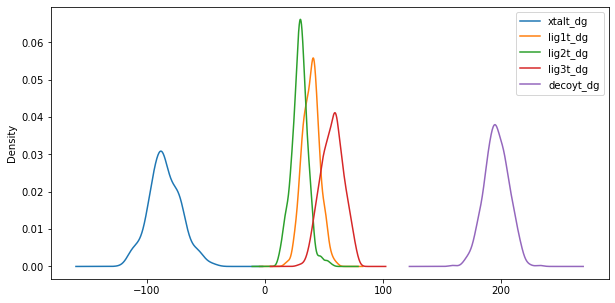

In [13]:
solva_comparison=pd.concat([xtal_p['DELTA G solv'],lig1_p['DELTA G solv'],
           lig2_p['DELTA G solv'],lig3_p['DELTA G solv'],decoy_p['DELTA G solv']],axis=1)
solva_comparison.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
solva_comparison.dropna(inplace=True)
solva_comparison.plot(kind='kde',figsize=[10,5])

In [14]:
solva_comparison.describe()

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
count,501.000000,501.000000,501.000000,501.000000,501.000000
mean,-84.361317,39.190592,29.687437,57.097270,196.008299
std,13.619586,7.153640,6.870263,9.258623,10.311775
min,-120.231372,17.446408,11.780194,29.228418,159.126817
25%,-92.982313,33.970804,25.700005,50.430475,189.274258
50%,-85.553200,39.495806,29.952255,57.729155,195.760538
75%,-75.157586,43.768169,33.601047,63.661457,203.352265
max,-41.279048,61.065578,56.562983,77.970362,232.656907


In [15]:
solva_comparison_bootstrapeado=solva_comparison.apply(boostraping_media,fun_estadistico=estadistico_media)

100%|██████████| 100000/100000 [00:03<00:00, 25414.91it/s]


In [16]:
pd.DataFrame(Confidence_Intervals(solva_comparison_bootstrapeado,solva_comparison))

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
0,-85.239269,38.31264,28.809484,56.219317,195.130347
1,-83.489149,40.06276,30.559604,57.969437,196.880467


<AxesSubplot:ylabel='Density'>

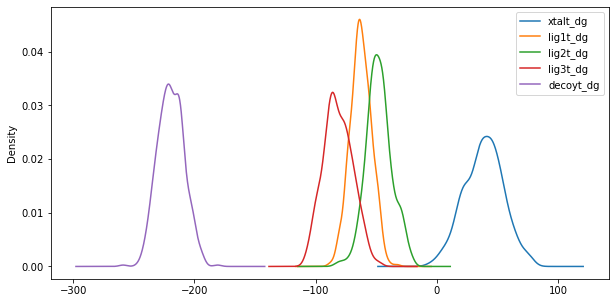

In [127]:
gas_comparison=pd.concat([xtal_p['DELTA G gas'],lig1_p['DELTA G gas'],
           lig2_p['DELTA G gas'],lig3_p['DELTA G gas'],decoy_p['DELTA G gas']],axis=1)
gas_comparison.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
gas_comparison.dropna(inplace=True)
gas_comparison.plot(kind='kde',figsize=[10,5])

In [128]:
gas_comparison.describe()

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
count,501.000000,501.000000,501.000000,501.000000,501.000000
mean,38.614014,-62.708201,-47.817443,-81.523627,-219.372276
std,15.974808,8.685185,10.540869,11.803841,10.692831
min,-6.327400,-88.530800,-83.434800,-108.019800,-258.835200
25%,27.156300,-68.527400,-54.554600,-89.505800,-227.203900
50%,38.506900,-63.073200,-48.194900,-82.156800,-219.707800
75%,49.297300,-56.591600,-42.122900,-73.549100,-211.878500
max,78.364100,-32.676200,-20.451200,-46.949000,-180.954900


In [ ]:
gas_comparison_bootstrapeado=gas_comparison.apply(boostraping_media,fun_estadistico=estadistico_media)

In [ ]:
pd.DataFrame(Confidence_Intervals(gas_comparison_bootstrapeado,gas_comparison))

<AxesSubplot:ylabel='Density'>

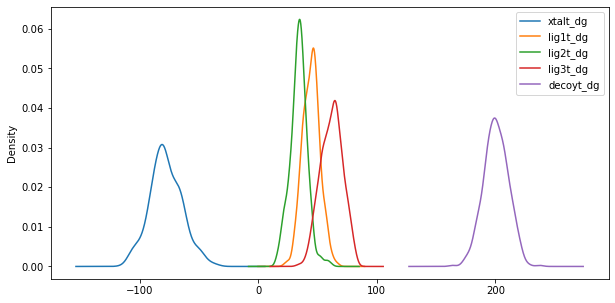

In [9]:
polar_comparison=pd.concat([xtal_p['EGB'],lig1_p['EGB'],
           lig2_p['EGB'],lig3_p['EGB'],decoy_p['EGB']],axis=1)
polar_comparison.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
polar_comparison.dropna(inplace=True)
polar_comparison.plot(kind='kde',figsize=[10,5])

In [10]:
polar_comparison.describe()

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
count,501.000000,501.000000,501.000000,501.000000,501.000000
mean,-77.823700,44.579730,34.160175,61.791730,200.381817
std,13.685141,7.222462,7.219339,9.130436,10.345185
min,-113.961000,22.180500,15.043100,33.881000,163.763100
25%,-86.439300,39.289500,30.226900,54.892300,193.667100
50%,-78.951500,44.801900,34.389100,62.401700,200.253700
75%,-68.524600,49.170400,38.293100,68.285500,207.847100
max,-34.295900,67.082700,61.661600,81.507100,237.242500


In [11]:
polar_comparison_bootstrapeado=polar_comparison.apply(boostraping_media,fun_estadistico=estadistico_media)

100%|██████████| 100000/100000 [00:03<00:00, 26022.58it/s]


In [12]:
pd.DataFrame(Confidence_Intervals(polar_comparison_bootstrapeado,polar_comparison))

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
0,-78.703162,43.700269,33.280714,60.912268,199.502355
1,-76.944181,45.459250,35.039695,62.671250,201.261336


In [ ]:
sns.heatmap(polar_comparison.corr())

<AxesSubplot:ylabel='Density'>

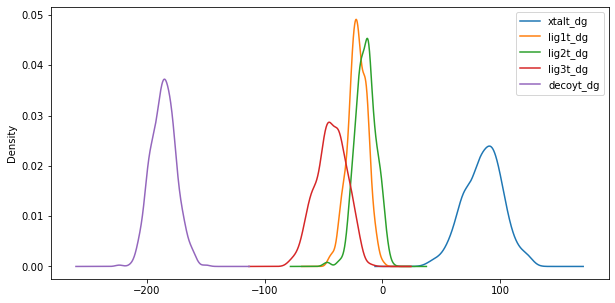

In [7]:
electro=pd.concat([xtal_p['EEL'],lig1_p['EEL'],
           lig2_p['EEL'],lig3_p['EEL'],decoy_p['EEL']],axis=1)
electro.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
electro.dropna(inplace=True)
electro.plot(kind='kde',figsize=[10,5])

In [8]:
polar_comparison.describe()

NameError: name 'polar_comparison' is not defined

<AxesSubplot:ylabel='Density'>

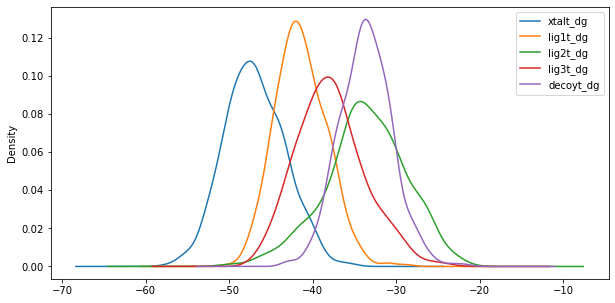

In [9]:
vanderw=pd.concat([xtal_p['VDWAALS'],lig1_p['VDWAALS'],
           lig2_p['VDWAALS'],lig3_p['VDWAALS'],decoy_p['VDWAALS']],axis=1)
vanderw.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
vanderw.dropna(inplace=True)
vanderw.plot(kind='kde',figsize=[10,5])

<AxesSubplot:>

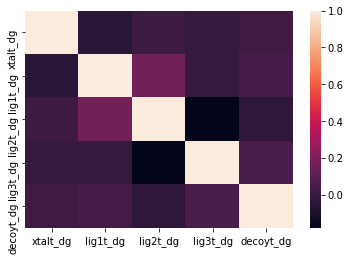

In [10]:
sns.heatmap(vanderw.corr())

<AxesSubplot:ylabel='Density'>

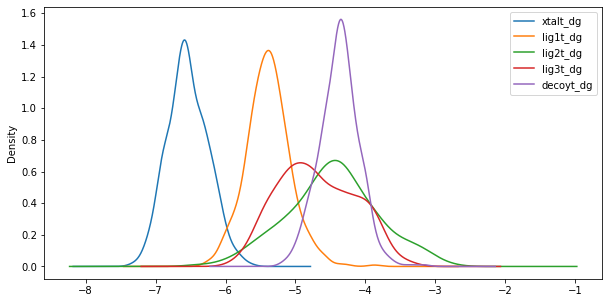

In [11]:
apolar_comparison=pd.concat([xtal_p['ESURF'],lig1_p['ESURF'],
           lig2_p['ESURF'],lig3_p['ESURF'],decoy_p['ESURF']],axis=1)
apolar_comparison.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
apolar_comparison.dropna(inplace=True)
apolar_comparison.plot(kind='kde',figsize=[10,5])

In [12]:
apolar_comparison.describe()

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
count,501.000000,501.000000,501.000000,501.000000,501.000000
mean,-6.537617,-5.389138,-4.472739,-4.694460,-4.373518
std,0.288372,0.314626,0.647717,0.544890,0.281700
min,-7.330361,-6.261289,-6.416821,-5.921753,-5.201345
25%,-6.722785,-5.590508,-4.871266,-5.116187,-4.554491
50%,-6.556217,-5.394239,-4.455854,-4.747935,-4.368323
75%,-6.334244,-5.203633,-4.079360,-4.255813,-4.205074
max,-5.633839,-3.871716,-2.790472,-3.353142,-3.162964


In [13]:
apolar_comparison_bootstrapeado=apolar_comparison.apply(boostraping_media,fun_estadistico=estadistico_media)

100%|██████████| 100000/100000 [00:03<00:00, 26274.08it/s]


In [14]:
pd.DataFrame(Confidence_Intervals(apolar_comparison_bootstrapeado,apolar_comparison))

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
0,-6.578663,-5.430184,-4.513785,-4.735507,-4.414564
1,-6.496470,-5.347992,-4.431593,-4.653314,-4.332371


<AxesSubplot:>

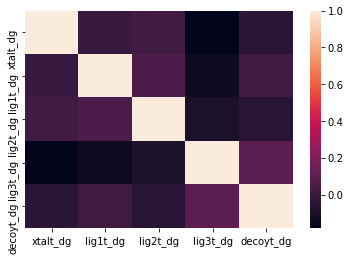

In [15]:
sns.heatmap(apolar_comparison.corr())

<AxesSubplot:ylabel='Density'>

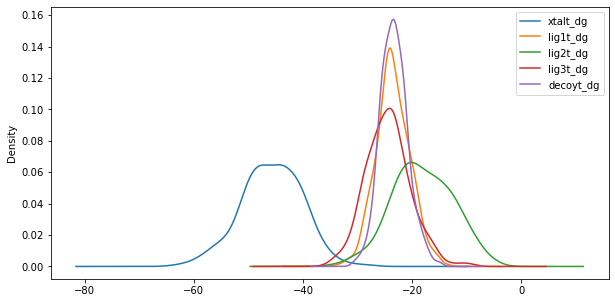

In [16]:
entalphy_comparison=pd.concat([xtal_t['Enthalpy (dH)'],lig1_t['Enthalpy (dH)'],
           lig2_t['Enthalpy (dH)'],lig3_t['Enthalpy (dH)'],decoy_t['Enthalpy (dH)']],axis=1)
entalphy_comparison.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
entalphy_comparison.dropna(inplace=True)
entalphy_comparison.plot(kind='kde',figsize=[10,5])

In [17]:
entalphy_comparison.describe()

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
count,501.000000,501.000000,501.000000,501.000000,501.000000
mean,-45.747303,-23.517609,-18.130007,-24.426357,-23.363978
std,5.615338,3.101117,5.577092,4.101457,2.501600
min,-63.628356,-33.668164,-34.451873,-35.781821,-30.732434
25%,-49.432896,-25.416618,-22.000540,-27.220611,-25.070807
50%,-45.768106,-23.757126,-18.376364,-24.508411,-23.433840
75%,-41.803359,-21.516935,-14.143319,-22.107902,-21.798026
max,-27.700638,-13.573316,-3.947213,-8.918026,-15.005201


In [18]:
entalphy_comparison_bootstrapeado=entalphy_comparison.apply(boostraping_media,fun_estadistico=estadistico_media)

100%|██████████| 100000/100000 [00:03<00:00, 25865.60it/s]


In [19]:
pd.DataFrame(Confidence_Intervals(entalphy_comparison_bootstrapeado,entalphy_comparison))

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
0,-46.148007,-23.918313,-18.530711,-24.827062,-23.764682
1,-45.347146,-23.117451,-17.729849,-24.026200,-22.963820


<AxesSubplot:>

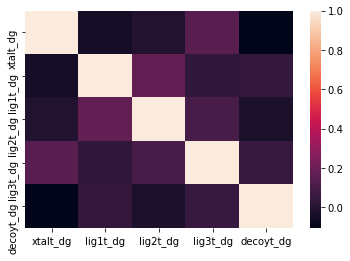

In [20]:
sns.heatmap(entalphy_comparison.corr())

<AxesSubplot:ylabel='Density'>

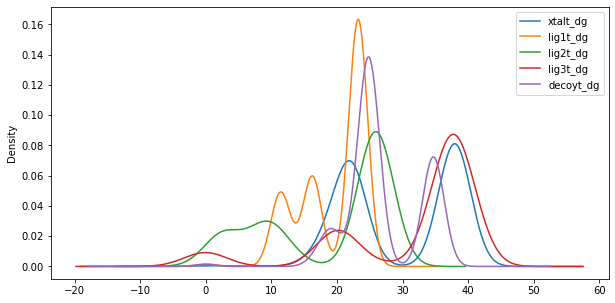

In [5]:
entropy_comparison=pd.concat([xtal_t['Interaction entropy (-TdS)'],lig1_t['Interaction entropy (-TdS)'],
           lig2_t['Interaction entropy (-TdS)'],lig3_t['Interaction entropy (-TdS)'],decoy_t['Interaction entropy (-TdS)']],axis=1)
entropy_comparison.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
entropy_comparison.dropna(inplace=True)
entropy_comparison.plot(kind='kde',figsize=[10,5])

In [6]:
entropy_comparison.describe()

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
count,501.000000,501.000000,501.000000,501.000000,501.000000
mean,29.622898,19.407047,18.622623,31.339338,26.950708
std,8.504264,4.991156,9.558261,11.358651,5.716838
min,0.000000,-0.364492,-0.425872,-0.454638,-0.423343
25%,22.110997,16.149548,9.845507,20.487929,24.561754
50%,35.245156,23.063322,25.761607,37.582959,24.914300
75%,37.944489,23.261158,25.938796,37.819480,34.630047
max,38.184440,23.554386,26.246314,38.207056,34.817215


In [7]:
entropy_comparison_bootstrapeado=entropy_comparison.apply(boostraping_media,fun_estadistico=estadistico_media)

100%|██████████| 100000/100000 [00:03<00:00, 26051.71it/s]


In [8]:
pd.DataFrame(Confidence_Intervals(entropy_comparison_bootstrapeado,entropy_comparison))

,xtalt_dg,lig1t_dg,lig2t_dg,lig3t_dg,decoyt_dg
0,28.862743,18.646893,17.862469,30.579184,26.190553
1,30.394495,20.178644,19.394220,32.110935,27.722304


<AxesSubplot:>

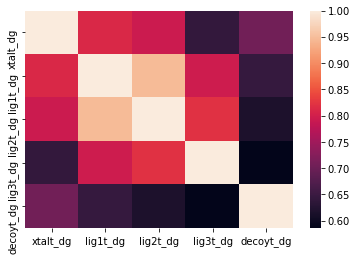

In [25]:
sns.heatmap(entropy_comparison.corr())

### Cleaning datasets

<AxesSubplot:ylabel='Density'>

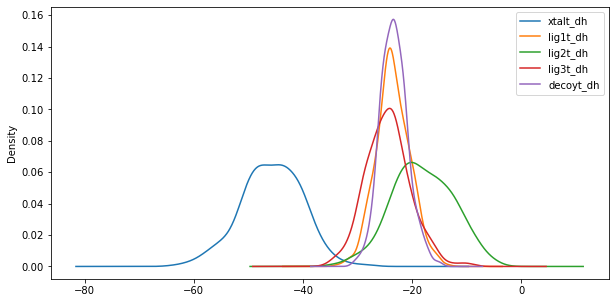

In [26]:
dHt_comparison=pd.concat([xtal_t['Enthalpy (dH)'],lig1_t['Enthalpy (dH)'],
           lig2_t['Enthalpy (dH)'],lig3_t['Enthalpy (dH)'],decoy_t['Enthalpy (dH)']],axis=1)
dHt_comparison.columns=['xtalt_dh','lig1t_dh','lig2t_dh','lig3t_dh','decoyt_dh']
dHt_comparison.dropna(inplace=True)
dHt_comparison.plot(kind='kde',figsize=[10,5])

In [27]:
dSt_comparison=pd.concat([xtal_t['Interaction entropy (-TdS)'],lig1_t['Interaction entropy (-TdS)'],
           lig2_t['Interaction entropy (-TdS)'],lig3_t['Interaction entropy (-TdS)'],decoy_t['Interaction entropy (-TdS)']],axis=1)
dSt_comparison.columns=['xtalt_ds','lig1t_ds','lig2t_ds','lig3t_ds','decoyt_ds']
dSt_comparison.dropna(inplace=True)
dSt_comparison

,xtalt_ds,lig1t_ds,lig2t_ds,lig3t_ds,decoyt_ds
0,0.000000,0.000000,0.000000,0.000000,0.000000
1,4.086132,-0.364492,-0.425872,-0.306960,-0.423343
2,13.414444,0.784267,0.090473,0.931558,0.082084
3,18.731812,12.873405,-0.048287,0.754369,17.529180
4,18.594374,12.735968,-0.095030,0.619516,17.391742
...,...,...,...,...,...
496,37.775914,23.008941,25.734959,37.436854,34.604749
497,37.774676,23.007703,25.733721,37.435616,34.603511
498,37.773441,23.006467,25.732486,37.434381,34.602275
499,37.772208,23.005234,25.731253,37.433148,34.601042


<AxesSubplot:ylabel='Density'>

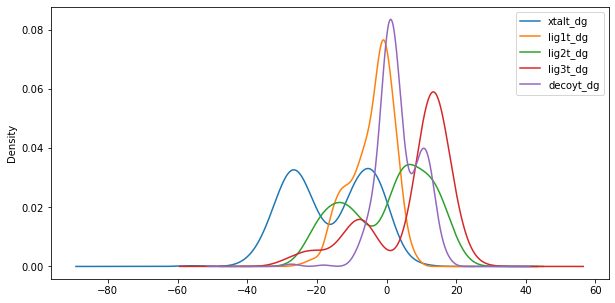

In [28]:
dGt_comparison=pd.concat([xtal_t['Total free energy (dG)'],lig1_t['Total free energy (dG)'],
           lig2_t['Total free energy (dG)'],lig3_t['Total free energy (dG)'],decoy_t['Total free energy (dG)']],axis=1)
dGt_comparison.columns=['xtalt_dg','lig1t_dg','lig2t_dg','lig3t_dg','decoyt_dg']
dGt_comparison.dropna(inplace=True)
dGt_comparison.plot(kind='kde',figsize=[10,5])

In [29]:
Decomp_Total=pd.concat([dHt_comparison,dSt_comparison,dGt_comparison],axis=1)
Decomp_Total.columns=['H(+)','H(I)','H(II)','H(III)','H(-)','TS(+)','TS(I)','TS(II)','TS(III)','TS(-)','G(+)','G(I)','G(II)',
                      'G(III)','G(-)']
Decomp_Total

,H(+),H(I),H(II),H(III),H(-),TS(+),TS(I),TS(II),TS(III),TS(-),G(+),G(I),G(II),G(III),G(-)
0,-56.064535,-25.014000,-11.720757,-10.160064,-28.351817,0.000000,0.000000,0.000000,0.000000,0.000000,-56.064535,-25.014000,-11.720757,-10.160064,-28.351817
1,-43.072561,-21.469810,-11.980393,-13.293274,-17.674759,4.086132,-0.364492,-0.425872,-0.306960,-0.423343,-38.986429,-21.834302,-12.406265,-13.600234,-18.098101
2,-43.417918,-23.283642,-12.630574,-11.490280,-26.417994,13.414444,0.784267,0.090473,0.931558,0.082084,-30.003474,-22.499375,-12.540101,-10.558722,-26.335910
3,-46.172572,-22.325249,-14.212374,-20.303628,-21.378733,18.731812,12.873405,-0.048287,0.754369,17.529180,-27.440760,-9.451844,-14.260661,-19.549260,-3.849553
4,-44.328775,-19.597997,-11.065760,-16.189191,-22.830697,18.594374,12.735968,-0.095030,0.619516,17.391742,-25.734401,-6.862029,-11.160790,-15.569674,-5.438955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
496,-45.884485,-25.933151,-15.469284,-23.671960,-23.786183,37.775914,23.008941,25.734959,37.436854,34.604749,-8.108571,-2.924210,10.265675,13.764895,10.818565
497,-44.249434,-16.867516,-22.266081,-23.528553,-24.015764,37.774676,23.007703,25.733721,37.435616,34.603511,-6.474758,6.140186,3.467640,13.907064,10.587746
498,-50.085158,-23.836995,-15.786001,-24.931578,-22.171651,37.773441,23.006467,25.732486,37.434381,34.602275,-12.311717,-0.830528,9.946485,12.502803,12.430624
499,-50.039043,-24.045832,-13.815710,-29.042909,-25.318067,37.772208,23.005234,25.731253,37.433148,34.601042,-12.266835,-1.040598,11.915543,8.390239,9.282975


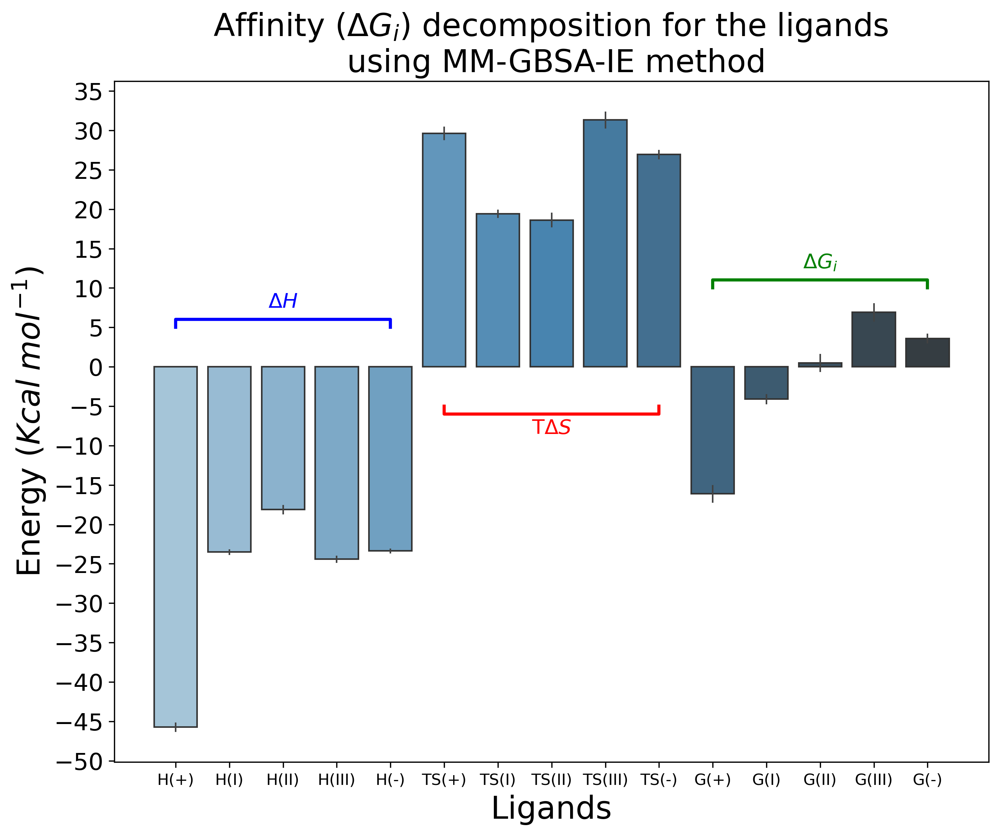

In [30]:
Decomp_Total_boxplot=Decomp_Total.copy()
Decomp_Total_boxplot

fig = plt.figure(figsize=[10,8],dpi=300)

sns_plot=sns.barplot(data=Decomp_Total_boxplot,palette='Blues_d',n_boot=100000,ci=95,errwidth=1,edgecolor='.2')
plt.title('Affinity ($\Delta G_{i}$) decomposition for the ligands \n using MM-GBSA-IE method',fontsize=20)
plt.xlabel("Ligands",fontsize=20)
plt.ylabel("Energy ($Kcal\;mol^{-1}$)",fontsize=20)

plt.tick_params(axis='x',labelsize=10)
plt.tick_params(axis='y',labelsize=15)
plt.yticks(np.arange(-50,40,5))


x1=0
x2=4
y1=5
y2=6

x11=5
x22=9
y11=-5
y22=-6

x111=10
x222=14
y111=10
y222=11

plt.text((x1+x2)*0.5,y1+2,'$\Delta H$',ha='center',va='bottom',color='blue',fontsize=13)
plt.text((x11+x22)*0.5,y11-4,'T$\Delta S$',ha='center',va='bottom',color='red',fontsize=13)
plt.text((x111+x222)*0.5,y111+2,'$\Delta G_{i}$',ha='center',va='bottom',color='green',fontsize=13)

plt.plot([x1,x1,x2,x2],[y1,y2,y2,y1],linewidth=2,color='blue')
plt.plot([x11,x11,x22,x22],[y11,y22,y22,y11],linewidth=2,color='red')
plt.plot([x111,x111,x222,x222],[y111,y222,y222,y111],linewidth=2,color='green')
plt.show()

fig.savefig('Decomp_Total.png',dpi=300)

## Levene test to check homocedasticity

In [31]:
from scipy.stats import levene

(stats,p)=levene(dGt_comparison['xtalt_dg'],dGt_comparison['decoyt_dg'],dGt_comparison['lig1t_dg'],
       dGt_comparison['lig2t_dg'],dGt_comparison['lig3t_dg'])

alpha=0.05 #(95 % significance)

if p>alpha:
    print('True difference between variances of groups is zero (variances are equal) (fail to reject H0)')
else:
    print('True difference between variances of groups (variances are not equal) (reject H0)')    

True difference between variances of groups (variances are not equal) (reject H0)


/home/edward/anaconda3/envs/MD/lib/python3.6/site-packages/ipykernel_launcher.py:67: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "transparency" which is no longer supported as of 3.3 and will become an error two minor releases later


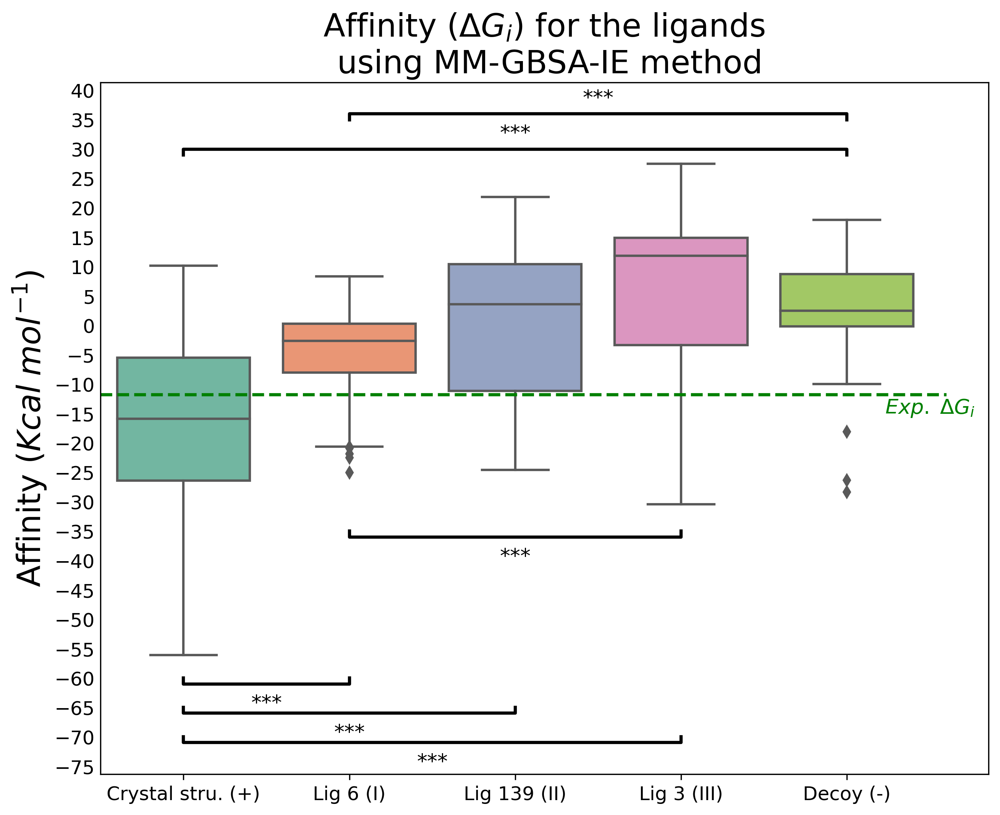

In [32]:
fig = plt.figure(figsize=[10,8],dpi=300)

dGt_boxplot=dGt_comparison.copy()
dGt_boxplot.columns=['Crystal stru. (+)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)','Decoy (-)']

ax1 = fig.add_subplot(111)
ax1.set_ylabel("Affinity ($Kcal\;mol^{-1}$)",fontsize=20)
sns_plot=sns.boxplot(data=dGt_boxplot,palette='Set2')
plt.title('Affinity ($\Delta G_{i}$) for the ligands \n using MM-GBSA-IE method',fontsize=20)


x1=0
x2=4
y1=29
y2=30

x11=0
x22=1
y11=-60
y22=-61

x111=0
x222=2
y111=-65
y222=-66

x1111=0
x2222=3
y1111=-70
y2222=-71

xi=1
xii=4
yi=35
yii=36

xa=1
xb=3
ya=-35
yb=-36


plt.yticks(np.arange(-80,50,5))
plt.tick_params(axis='y',which='both',length=0,labelsize='large')
plt.tick_params(axis='x',labelsize='large')

plt.plot([x1,x1,x2,x2],[y1,y2,y2,y1],linewidth=2,color='black')
plt.plot([x11,x11,x22,x22],[y11,y22,y22,y11],linewidth=2,color='black')
plt.plot([x111,x111,x222,x222],[y111,y222,y222,y111],linewidth=2,color='black')
plt.plot([x1111,x1111,x2222,x2222],[y1111,y2222,y2222,y1111],linewidth=2,color='black')
plt.plot([xi,xi,xii,xii],[yi,yii,yii,yi],linewidth=2,color='black')
plt.plot([xa,xa,xb,xb],[ya,yb,yb,ya],linewidth=2,color='black')


plt.text((x1+x2)*0.5,y1+2,'***',ha='center',va='bottom',color='black',fontsize=13)
plt.text((x11+x22)*0.5,y11-6,'***',ha='center',va='bottom',color='black',fontsize=13)
plt.text((x111+x222)*0.5,y111-6,'***',ha='center',va='bottom',color='black',fontsize=13)
plt.text((x1111+x2222)*0.5,y1111-6,'***',ha='center',va='bottom',color='black',fontsize=13)
plt.text((xi+xii)*0.5,yi+2,'***',ha='center',va='bottom',color='black',fontsize=13)
plt.text((xa+xb)*0.5,ya-6,'***',ha='center',va='bottom',color='black',fontsize=13)


plt.plot([-0.5,-0.5,4.6,4.6],[-11.82,-11.82,-11.82,-11.82],'--',linewidth=2,color='green')
plt.text((0+9)*0.5,-11.82-4,'$Exp.\;\Delta G_{i}$',ha='center',va='bottom',color='green',fontsize=13)


sns_plot.figure.savefig('dG_box.png',dpi=300,transparency=True)
plt.show()

## Analysis of variance (ANOVA) and Kruskal-Wallis test

In [33]:
from scipy.stats import f_oneway

f_oneway(dGt_comparison['xtalt_dg'],dGt_comparison['decoyt_dg'],dGt_comparison['lig1t_dg'],
       dGt_comparison['lig2t_dg'],dGt_comparison['lig3t_dg'])

alpha=0.05 #(95 % significance)

if p>alpha:
    print('True difference between means of groups is zero (population means are equal) (fail to reject H0)')
else:
    print('True difference between means of groups is different of zero (populations means are not equal) (reject H0)')    

True difference between means of groups is different of zero (populations means are not equal) (reject H0)


In [34]:
from scipy.stats import kruskal

kruskal(dGt_comparison['xtalt_dg'],dGt_comparison['decoyt_dg'],dGt_comparison['lig1t_dg'],
       dGt_comparison['lig2t_dg'],dGt_comparison['lig3t_dg'])
if p>alpha:
    print('True difference between median of groups is zero (population median are equal) (fail to reject H0)')
else:
    print('True difference between median of groups is different of zero (populations median are not equal) (reject H0)')    

True difference between median of groups is different of zero (populations median are not equal) (reject H0)


# Games-Howell and Tuckey post-hoc test

In [35]:
##Tuckey post-hoc test

from statsmodels.stats.multicomp import pairwise_tukeyhsd

ensayo=pd.DataFrame({'score':dGt_comparison.values.flatten(),
                    'group':np.repeat(dGt_comparison.columns,repeats=501)})

tukey_test=pairwise_tukeyhsd(endog=ensayo['score'],groups=ensayo['group'],alpha=0.001)
print(tukey_test)

    #if p>0.05:
    #    print('True difference between group means is zero (fail to reject H0. Statistically highly significant')
    #else:
    #    print('True difference between group means is different from zero (reject H0)') 

    Multiple Comparison of Means - Tukey HSD, FWER=0.00    
  group1   group2  meandiff p-adj   lower    upper   reject
-----------------------------------------------------------
decoyt_dg lig1t_dg -12.1873  0.001 -14.7685   -9.606   True
decoyt_dg lig2t_dg  -2.4132 0.0027  -4.9944   0.1681  False
decoyt_dg lig3t_dg  -0.6652 0.8373  -3.2465    1.916  False
decoyt_dg xtalt_dg -18.9243  0.001 -21.5056  -16.343   True
 lig1t_dg lig2t_dg   9.7741  0.001   7.1928  12.3554   True
 lig1t_dg lig3t_dg   11.522  0.001   8.9408  14.1033   True
 lig1t_dg xtalt_dg   -6.737  0.001  -9.3183  -4.1558   True
 lig2t_dg lig3t_dg   1.7479 0.0655  -0.8334   4.3292  False
 lig2t_dg xtalt_dg -16.5111  0.001 -19.0924 -13.9299   True
 lig3t_dg xtalt_dg -18.2591  0.001 -20.8403 -15.6778   True
-----------------------------------------------------------


In [36]:
#Generating statistics from each group

alpha=0.05

k=len(np.unique(dGt_comparison.columns))

Howel_dict={}
Howel_dict['means']={'xtalt_dg':dGt_comparison['xtalt_dg'].mean(),'decoyt_dg':dGt_comparison['decoyt_dg'].mean(),
                        'lig1t_dg':dGt_comparison['lig1t_dg'].mean(),'lig2t_dg':dGt_comparison['lig2t_dg'].mean(),
                        'lig3t_dg':dGt_comparison['lig3t_dg'].mean()}

Howel_dict['obs']={'xtalt_dg':len(dGt_comparison['xtalt_dg']),'decoyt_dg':len(dGt_comparison['decoyt_dg']),
                     'lig1t_dg':len(dGt_comparison['lig1t_dg']),'lig2t_dg':len(dGt_comparison['lig2t_dg']),
                     'lig3t_dg':len(dGt_comparison['lig3t_dg'])}

Howel_dict['variance']={'xtalt_dg':np.var(dGt_comparison['xtalt_dg']),'decoyt_dg':np.var(dGt_comparison['decoyt_dg']),
                          'lig1t_dg':np.var(dGt_comparison['lig1t_dg']),'lig2t_dg':np.var(dGt_comparison['lig2t_dg']),
                          'lig3t_dg':np.var(dGt_comparison['lig3t_dg'])}
Howel_dict

{'means': {'xtalt_dg': -16.124405187593247,
  'decoyt_dg': 3.5867302227625935,
  'lig1t_dg': -4.1105616482524265,
  'lig2t_dg': 0.49261643496683866,
  'lig3t_dg': 6.912980995892354},
 'obs': {'xtalt_dg': 501,
  'decoyt_dg': 501,
  'lig1t_dg': 501,
  'lig2t_dg': 501,
  'lig3t_dg': 501},
 'variance': {'xtalt_dg': 140.2901961323976,
  'decoyt_dg': 36.108252965767434,
  'lig1t_dg': 37.47516720589192,
  'lig2t_dg': 147.19129695375446,
  'lig3t_dg': 149.55244708512475}}

In [37]:
##All possible combinations between groups

from itertools import combinations

combs=list(combinations(dGt_comparison.columns,2))
combs

[('xtalt_dg', 'lig1t_dg'),
 ('xtalt_dg', 'lig2t_dg'),
 ('xtalt_dg', 'lig3t_dg'),
 ('xtalt_dg', 'decoyt_dg'),
 ('lig1t_dg', 'lig2t_dg'),
 ('lig1t_dg', 'lig3t_dg'),
 ('lig1t_dg', 'decoyt_dg'),
 ('lig2t_dg', 'lig3t_dg'),
 ('lig2t_dg', 'decoyt_dg'),
 ('lig3t_dg', 'decoyt_dg')]

In [38]:
##Creating test

group_comps=[]
mean_differences=[]
degrees_freedom=[]
t_values=[]
p_values=[]
std_err=[]
up_conf=[]
low_conf=[]

for i in combs:
    ##Mean difference for each group combination
    diff=Howel_dict['means'][i[1]]-Howel_dict['means'][i[0]]
    
    ##t-value for each group combination
    t_val=np.abs(diff)/np.sqrt((Howel_dict['variance'][i[0]]/Howel_dict['obs'][i[0]])+
                               (Howel_dict['variance'][i[1]]/Howel_dict['obs'][i[1]])) 
    
    ##Numerator of Welch-Satterhwaite equation
    
    df_num=(Howel_dict['variance'][i[0]]/Howel_dict['obs'][i[0]] +
            Howel_dict['variance'][i[1]]/Howel_dict['obs'][i[1]] )**2
    
    
    ##Denominator of Welch-Satterhwaite equation
    
    df_denom=((Howel_dict['variance'][i[0]]/Howel_dict['obs'][i[0]])**2/(Howel_dict['obs'][i[0]]-1)+
              (Howel_dict['variance'][i[1]]/Howel_dict['obs'][i[1]])**2/(Howel_dict['obs'][i[1]]-1))
        
    ##Degrees of freedom
    df=df_num/df_denom
    
        
    ##p-value of the group comparison
    
    p_val=float(psturng(t_val*np.sqrt(2),k,5))
    
    ##Standard error of each group combination
    
    se=np.sqrt(0.5*(Howel_dict['variance'][i[0]]/Howel_dict['obs'][i[0]]+
                    Howel_dict['variance'][i[1]]/Howel_dict['obs'][i[1]]))
    
    ##Upper and lower confidence intervals
    
    upper_conf=diff+qsturng(1-alpha,k,df)
    lower_conf=diff-qsturng(1-alpha,k,df)
    
    ##Appending
    
    mean_differences.append(diff)
    degrees_freedom.append(df)
    t_values.append(t_val)
    p_values.append(p_val)
    std_err.append(se)
    up_conf.append(upper_conf)
    low_conf.append(lower_conf)
    group_comps.append(str(i[0])+'<-->'+str(i[1]))
    

In [39]:
##Results in dataframe

GH_df=pd.DataFrame({'groups':group_comps,
                   'mean difference':mean_differences,
                   'std_error':std_err,
                   't_value':t_values,
                   'p_value':p_values,
                   'upper_limit':up_conf,
                   'lower_limit':low_conf})
GH_df['p_value'].round(2)
GH_df

,groups,mean difference,std_error,t_value,p_value,upper_limit,lower_limit
0,xtalt_dg<-->lig1t_dg,12.013844,0.421201,20.168670,0.001000,15.880921,8.146766
1,xtalt_dg<-->lig2t_dg,16.617022,0.535638,21.936488,0.001000,20.481731,12.752312
2,xtalt_dg<-->lig3t_dg,23.037386,0.537833,30.288023,0.001000,26.902099,19.172674
3,xtalt_dg<-->decoyt_dg,19.711135,0.419579,33.218738,0.001000,23.578314,15.843956
4,lig1t_dg<-->lig2t_dg,4.603178,0.429299,7.581980,0.003402,8.470387,0.735969
5,lig1t_dg<-->lig3t_dg,11.023543,0.432035,18.042104,0.001000,14.890795,7.156291
6,lig1t_dg<-->decoyt_dg,7.697292,0.270992,20.084769,0.001000,11.562000,3.832584
7,lig2t_dg<-->lig3t_dg,6.420365,0.544198,8.342338,0.002189,10.285070,2.555659
8,lig2t_dg<-->decoyt_dg,3.094114,0.427707,5.115339,0.019120,6.961424,-0.773196
9,lig3t_dg<-->decoyt_dg,-3.326251,0.430453,5.464040,0.014497,0.541102,-7.193604


In [40]:
GH_df.loc[GH_df['p_value']<=0.001] #(Son diferentes entre sí)

,groups,mean difference,std_error,t_value,p_value,upper_limit,lower_limit
0,xtalt_dg<-->lig1t_dg,12.013844,0.421201,20.168670,0.001,15.880921,8.146766
1,xtalt_dg<-->lig2t_dg,16.617022,0.535638,21.936488,0.001,20.481731,12.752312
2,xtalt_dg<-->lig3t_dg,23.037386,0.537833,30.288023,0.001,26.902099,19.172674
3,xtalt_dg<-->decoyt_dg,19.711135,0.419579,33.218738,0.001,23.578314,15.843956
5,lig1t_dg<-->lig3t_dg,11.023543,0.432035,18.042104,0.001,14.890795,7.156291
6,lig1t_dg<-->decoyt_dg,7.697292,0.270992,20.084769,0.001,11.562000,3.832584


In [41]:
for i in GH_df['p_value']: 
    
    if i>0.001:
        print('True difference between group means is zero (fail to reject H0. Statistically highly significant')
    else:
        print('True difference between group means is different from zero (reject H0)')    

True difference between group means is different from zero (reject H0)
True difference between group means is different from zero (reject H0)
True difference between group means is different from zero (reject H0)
True difference between group means is different from zero (reject H0)
True difference between group means is zero (fail to reject H0. Statistically highly significant
True difference between group means is different from zero (reject H0)
True difference between group means is different from zero (reject H0)
True difference between group means is zero (fail to reject H0. Statistically highly significant
True difference between group means is zero (fail to reject H0. Statistically highly significant
True difference between group means is zero (fail to reject H0. Statistically highly significant


In [42]:
GH_df

,groups,mean difference,std_error,t_value,p_value,upper_limit,lower_limit
0,xtalt_dg<-->lig1t_dg,12.013844,0.421201,20.168670,0.001000,15.880921,8.146766
1,xtalt_dg<-->lig2t_dg,16.617022,0.535638,21.936488,0.001000,20.481731,12.752312
2,xtalt_dg<-->lig3t_dg,23.037386,0.537833,30.288023,0.001000,26.902099,19.172674
3,xtalt_dg<-->decoyt_dg,19.711135,0.419579,33.218738,0.001000,23.578314,15.843956
4,lig1t_dg<-->lig2t_dg,4.603178,0.429299,7.581980,0.003402,8.470387,0.735969
5,lig1t_dg<-->lig3t_dg,11.023543,0.432035,18.042104,0.001000,14.890795,7.156291
6,lig1t_dg<-->decoyt_dg,7.697292,0.270992,20.084769,0.001000,11.562000,3.832584
7,lig2t_dg<-->lig3t_dg,6.420365,0.544198,8.342338,0.002189,10.285070,2.555659
8,lig2t_dg<-->decoyt_dg,3.094114,0.427707,5.115339,0.019120,6.961424,-0.773196
9,lig3t_dg<-->decoyt_dg,-3.326251,0.430453,5.464040,0.014497,0.541102,-7.193604


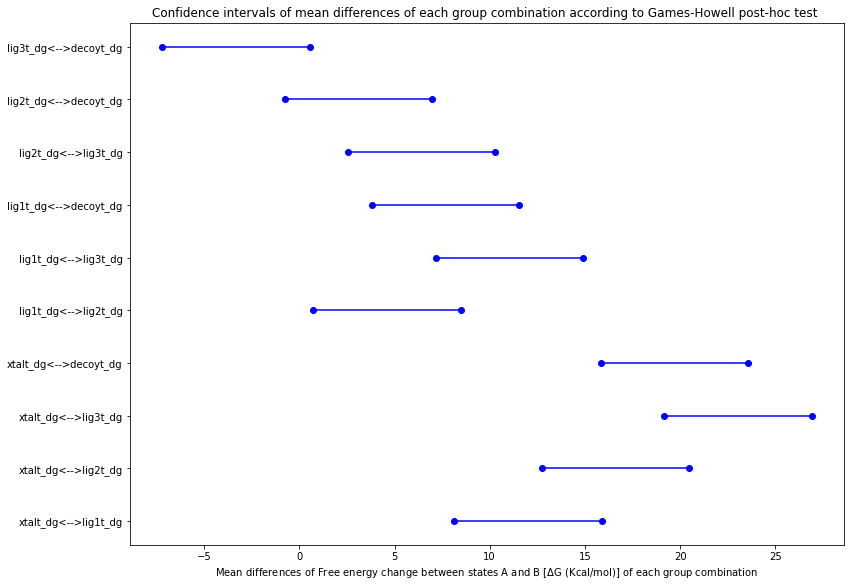

In [43]:
fig = plt.figure(figsize=[12.8, 9.6])

for lower, upper, y in zip(GH_df['lower_limit'],GH_df['upper_limit'],range(len(GH_df))):
    sns.lineplot()
    plt.plot((lower, upper),(y,y),'ro-',color='blue')
         

    
plt.yticks(range(len(GH_df['groups'])),list(GH_df['groups']))


plt.xlabel("Mean differences of Free energy change between states A and B [$\\Delta$G (Kcal/mol)] of each group combination")
plt.title("Confidence intervals of mean differences of each group combination according to Games-Howell post-hoc test ")
plt.show()

## Bootstraping data to obtain confidence intervals

In [44]:
##Function to boostraping (empirical bootstraping)

from tqdm import tqdm

def estadistico_media(X):
    
    estadistico=np.mean(X)
    return(estadistico)

def boostraping_media(X,fun_estadistico,n_iteraciones=100000):
    
    n=len(X)
    stadistico_muestra=fun_estadistico(X)
    dist_boot=np.full(shape=n_iteraciones,fill_value=np.nan)
    
    for i in tqdm(range(n_iteraciones)):
        resample=np.random.choice(X,size=n,replace=True)
        dist_boot[i]=fun_estadistico(resample)-stadistico_muestra
        #dist_boot[i]=fun_estadistico(resample)-stadistico_muestra

    return dist_boot

In [45]:
import scipy.stats as stats

def Confidence_Intervals(X,Y):
##IC Bootstraping empírico
    #cuantiles=np.quantile(a=X,q=[0.025,0.975])
    cuantiles=np.quantile(a=X,q=[0.025,0.975])
    stadistico_muestra=estadistico_media(Y)
    intervalo=[stadistico_muestra-cuantiles[1],stadistico_muestra-cuantiles[0]]
    return intervalo

In [46]:
estadistico_media

<function __main__.estadistico_media>

In [47]:
media_boostrapeada=pd.DataFrame(estadistico_media(dGt_boxplot))
media_boostrapeada

,0
Crystal stru. (+),-16.124405
Lig 6 (I),-4.110562
Lig 139 (II),0.492616
Lig 3 (III),6.912981
Decoy (-),3.586730


In [48]:
dGt_comparison_bootstrapeado=dGt_boxplot.apply(boostraping_media,fun_estadistico=estadistico_media)
dGt_comparison_bootstrapeado

100%|██████████| 100000/100000 [00:03<00:00, 25607.08it/s]


,Crystal stru. (+),Lig 6 (I),Lig 139 (II),Lig 3 (III),Decoy (-)
0,-0.317785,0.558258,0.712135,0.596667,0.176968
1,-0.108518,-0.342069,0.150598,0.317017,-0.189204
2,0.422973,-0.067027,0.005417,0.196771,-0.459597
3,-0.031026,-0.197779,-0.794182,0.304120,0.031669
4,1.129090,0.281609,0.132161,-1.191429,-0.121842
...,...,...,...,...,...
99995,0.308694,-0.591987,0.039821,-0.348978,0.371291
99996,0.661064,0.140370,-0.351957,0.728131,-0.053905
99997,0.018828,-0.170876,0.555741,-0.504934,0.102924
99998,0.003630,-0.295370,0.070528,1.636392,-0.238587


In [49]:
inter_confian=Confidence_Intervals(dGt_comparison_bootstrapeado,dGt_boxplot)
inter_confian_df=pd.DataFrame(inter_confian)
inter_confian_df.columns

Index(['Crystal stru. (+)', 'Lig 6 (I)', 'Lig 139 (II)', 'Lig 3 (III)',
       'Decoy (-)'],
      dtype='object')

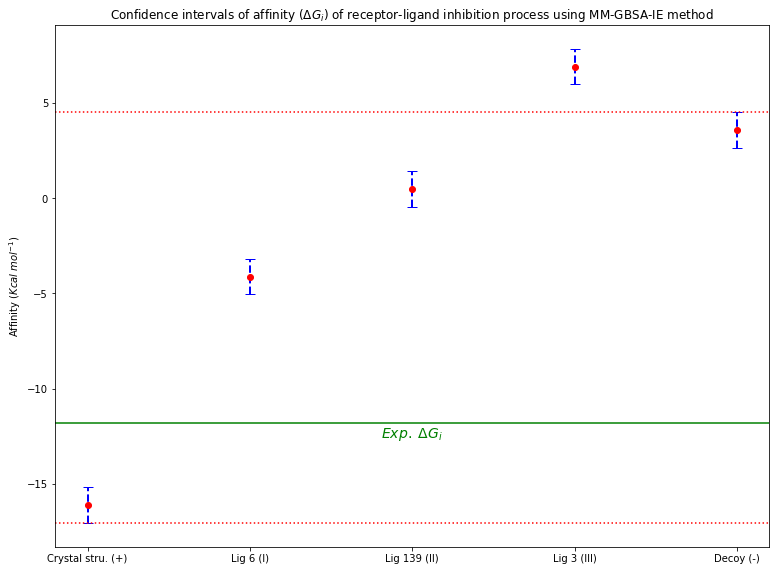

In [50]:
fig = plt.figure(figsize=[12.8, 9.6])

for lower, upper, y in zip(inter_confian_df.T[0],inter_confian_df.T[1],range(len(inter_confian_df.T))):
    plt.plot((y,y),(lower, upper),'--_',color='blue',linewidth=2,markersize=10)
    
plt.xticks(range(len(inter_confian_df.T.index)),list(inter_confian_df.T.index))

plt.axhline(y=inter_confian_df.T.loc['Crystal stru. (+)',0],color='r',linestyle=':')
plt.axhline(y=inter_confian_df.T.loc['Decoy (-)',1],color='r',linestyle=':')
plt.axhline(y=-11.82,color='green',linestyle='-')
plt.text((0+4)*0.5,-11.82-1,'$Exp.\;\Delta G_{i}$',ha='center',va='bottom',color='green',fontsize=14)

plt.plot(0,media_boostrapeada.loc['Crystal stru. (+)',0],'ro')
plt.plot(1,media_boostrapeada.loc['Lig 6 (I)',0],'ro')
plt.plot(2,media_boostrapeada.loc['Lig 139 (II)',0],'ro')
plt.plot(3,media_boostrapeada.loc['Lig 3 (III)',0],'ro')
plt.plot(4,media_boostrapeada.loc['Decoy (-)',0],'ro')

plt.ylabel("Affinity ($Kcal\;mol^{-1}$)")
plt.title(r'Confidence intervals of affinity ($\Delta G_{i}$) of receptor-ligand inhibition process using MM-GBSA-IE method')
plt.show()

fig.savefig('dG_conf_int.pdf')

In [51]:
inter_confian_df.columns=['(+)','(I)','(II)','(III)','(-)']
inter_confian_df

,(+),(I),(II),(III),(-)
0,-17.055237,-5.041394,-0.438216,5.982149,2.655898
1,-15.183144,-3.169300,1.433878,7.854242,4.527992


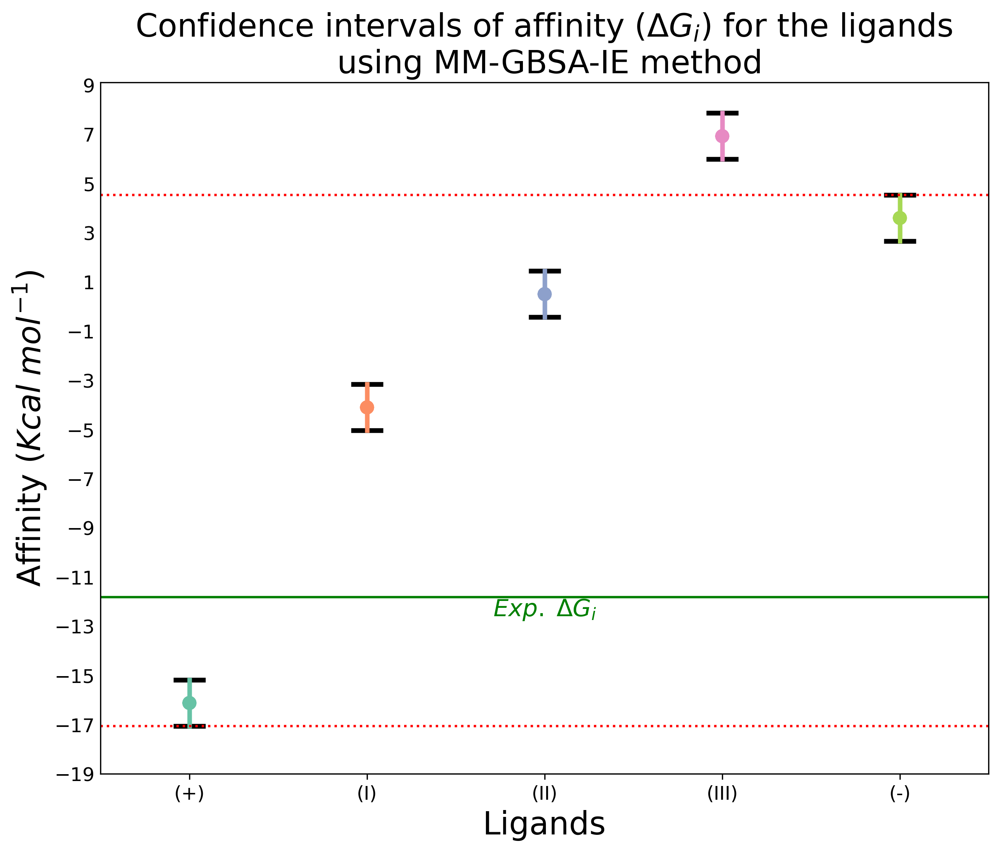

In [52]:
fig = plt.figure(figsize=[10,8],dpi=300)

for lower, upper, y in zip(inter_confian_df.T[0],inter_confian_df.T[1],range(len(inter_confian_df.T))):
    plt.plot((y,y),(lower, upper),'_',color='black',markersize=20,markeredgewidth=3)
    sns.pointplot(data=inter_confian_df,join=True,palette='Set2',ci=95)
    
plt.yticks(np.arange(-19,10,2))
plt.tick_params(axis='y',which='both',length=0,labelsize='large')
plt.tick_params(axis='x',labelsize='large')


plt.axhline(y=inter_confian_df.T.loc['(+)',0],color='r',linestyle=':')
plt.axhline(y=inter_confian_df.T.loc['(-)',1],color='r',linestyle=':')
plt.axhline(y=-11.82,color='green',linestyle='-')
plt.text((0+4)*0.5,-11.82-1,'$Exp.\;\Delta G_{i}$',ha='center',va='bottom',color='green',fontsize=15)
plt.ylabel("Affinity ($Kcal\;mol^{-1}$)",fontsize=20)
plt.xlabel("Ligands",fontsize=20)

plt.title('Confidence intervals of affinity ($\Delta G_{i}$) for the ligands \n using MM-GBSA-IE method',
          fontsize=20)
plt.show()

fig.savefig('dG_conf_int.png',dpi=300)


## RMSD

In [53]:
#gmx_mpi rms -s em.tpr -f md_0_10noPBC.xtc -n index.ndx -o rmsd_lig.xvg or MDAnalysis with emcenter.gro

In [54]:
protxtal=pd.read_csv('rmsd_xtal.csv',names=['X','frame','time','rmsd_xtal'])
ligxtal=pd.read_csv('rmsdlig_xtal.csv',names=['X','frame','time','rmsd_xtallig'])

protdecoy=pd.read_csv('rmsd_decoy.csv',names=['X','frame','time','rmsd_decoy'])
ligdecoy=pd.read_csv('rmsdlig_decoy.csv',names=['X','frame','time','rmsd_decoylig'])

prot1=pd.read_csv('rmsd_lig1.csv',names=['X','frame','time','rmsd_lig1'])
lig1=pd.read_csv('rmsdlig_lig1.csv',names=['X','frame','time','rmsd_liglig1'])

prot2=pd.read_csv('rmsd_lig2.csv',names=['X','frame','time','rmsd_lig2'])
lig2=pd.read_csv('rmsdlig_lig2.csv',names=['X','frame','time','rmsd_liglig2'])

prot3=pd.read_csv('rmsd_lig3.csv',names=['X','frame','time','rmsd_lig3'])
lig3=pd.read_csv('rmsdlig_lig3.csv',names=['X','frame','time','rmsd_liglig3'])

## Averaging and plotting data

### Protein

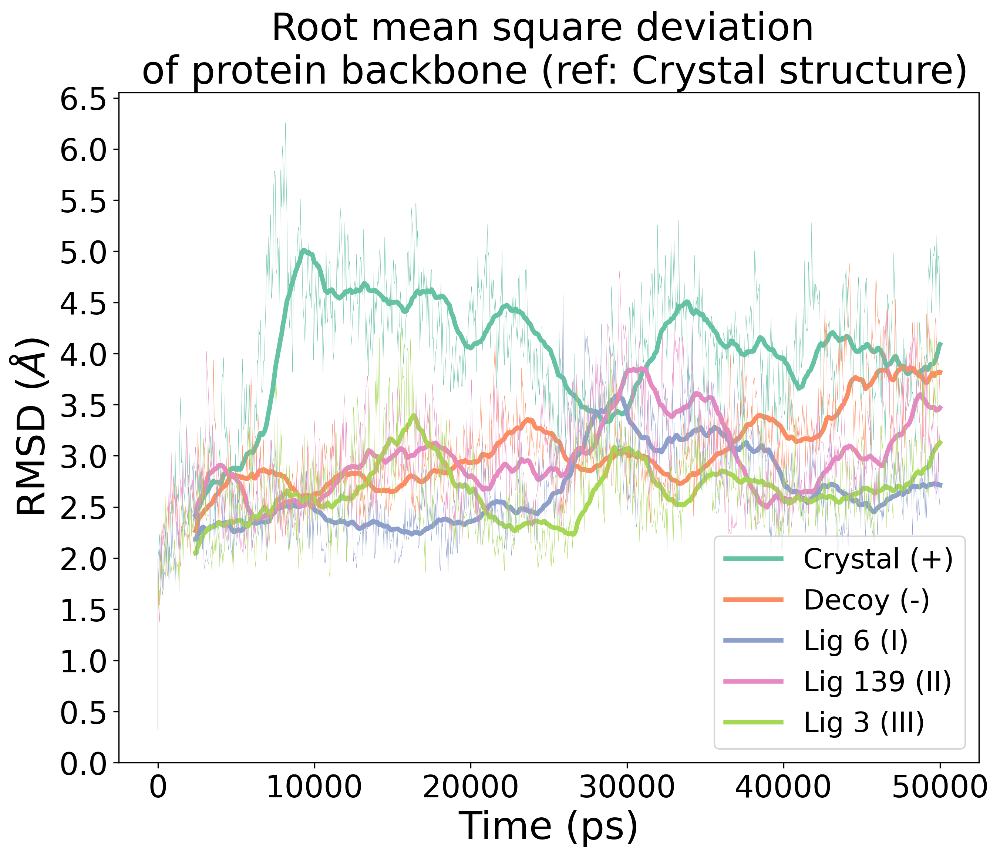

In [55]:
fig = plt.figure(figsize=[10,8],dpi=300)

proteinrmsd=pd.DataFrame([protxtal['time'],protxtal['rmsd_xtal'],protdecoy['rmsd_decoy'],
                         prot1['rmsd_lig1'],prot2['rmsd_lig2'],prot3['rmsd_lig3']])
proteinrmsd_df=proteinrmsd.T.melt('time',var_name='rmsd',value_name='vals')

protaver=proteinrmsd.T[['rmsd_xtal','rmsd_decoy','rmsd_lig1','rmsd_lig2','rmsd_lig3']].rolling(window=50).mean()
protaver['time']=proteinrmsd.T['time']
protaver_df=protaver.melt('time',var_name='rmsd',value_name='vals_aver')

sns.lineplot(x='time',y='vals_aver',data=protaver_df,hue='rmsd',palette='Set2',linewidth=3)
sns.lineplot(x='time',y='vals',data=proteinrmsd_df,hue='rmsd',palette='Set2',linewidth=0.2)
plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=18)
plt.ylabel("RMSD ($\AA$)",fontsize=25)
plt.xlabel("Time (ps)",fontsize=25)
plt.title('Root mean square deviation \n of protein backbone (ref: Crystal structure)',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)

plt.yticks(np.arange(0,7,0.5))
plt.show()
fig.savefig('RMSDprot.png',dpi=300)

### Ligand

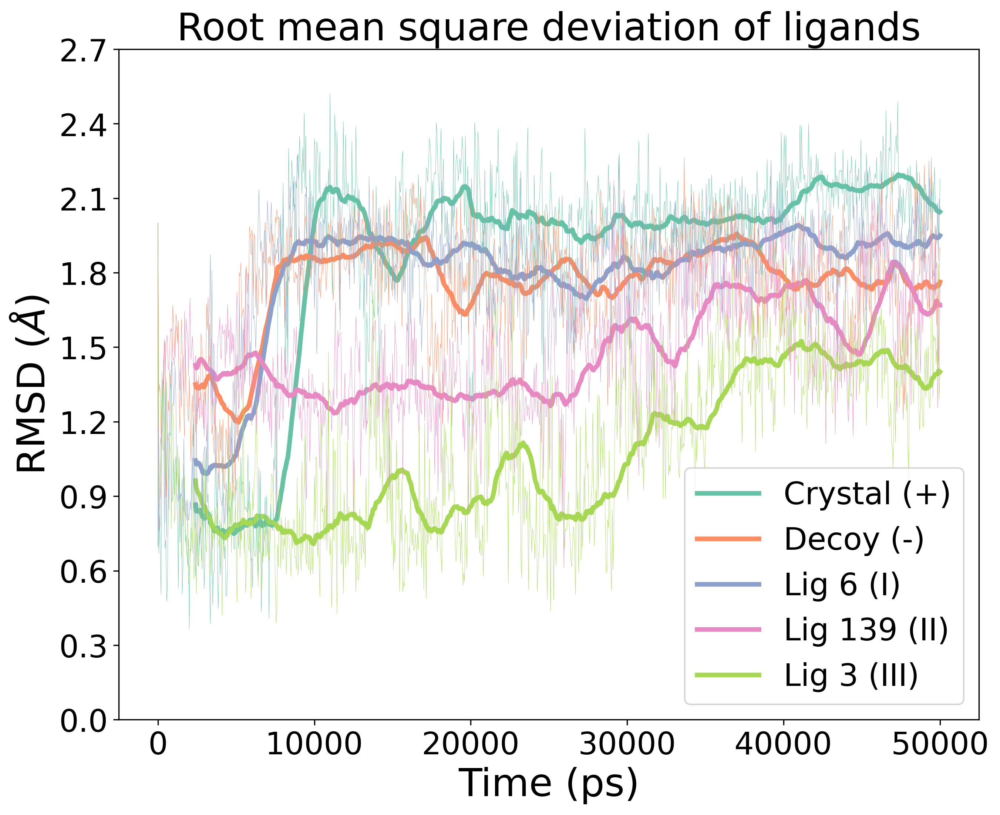

In [56]:
fig = plt.figure(figsize=[10,8],dpi=300)

ligrmsd=pd.DataFrame([ligxtal['time'],ligxtal['rmsd_xtallig'],ligdecoy['rmsd_decoylig'],
                         lig1['rmsd_liglig1'],lig2['rmsd_liglig2'],lig3['rmsd_liglig3']])
ligrmsd_df=ligrmsd.T.melt('time',var_name='rmsd',value_name='vals')

ligtaver=ligrmsd.T[['rmsd_xtallig','rmsd_decoylig','rmsd_liglig1','rmsd_liglig2','rmsd_liglig3']].rolling(window=50).mean()
ligtaver['time']=ligrmsd.T['time']
ligtaver_df=ligtaver.melt('time',var_name='rmsd',value_name='vals_aver')

sns.lineplot(x='time',y='vals_aver',data=ligtaver_df,hue='rmsd',palette='Set2',linewidth=3)
sns.lineplot(x='time',y='vals',data=ligrmsd_df,hue='rmsd',palette='Set2',linewidth=0.2)

plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=20)

plt.ylabel("RMSD ($\AA$)",fontsize=25)
plt.xlabel("Time (ps)",fontsize=25)
plt.title('Root mean square deviation of ligands',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)

plt.yticks(np.arange(0,2.8,0.3))
plt.show()
fig.savefig('RMSDlig.png',dpi=300)

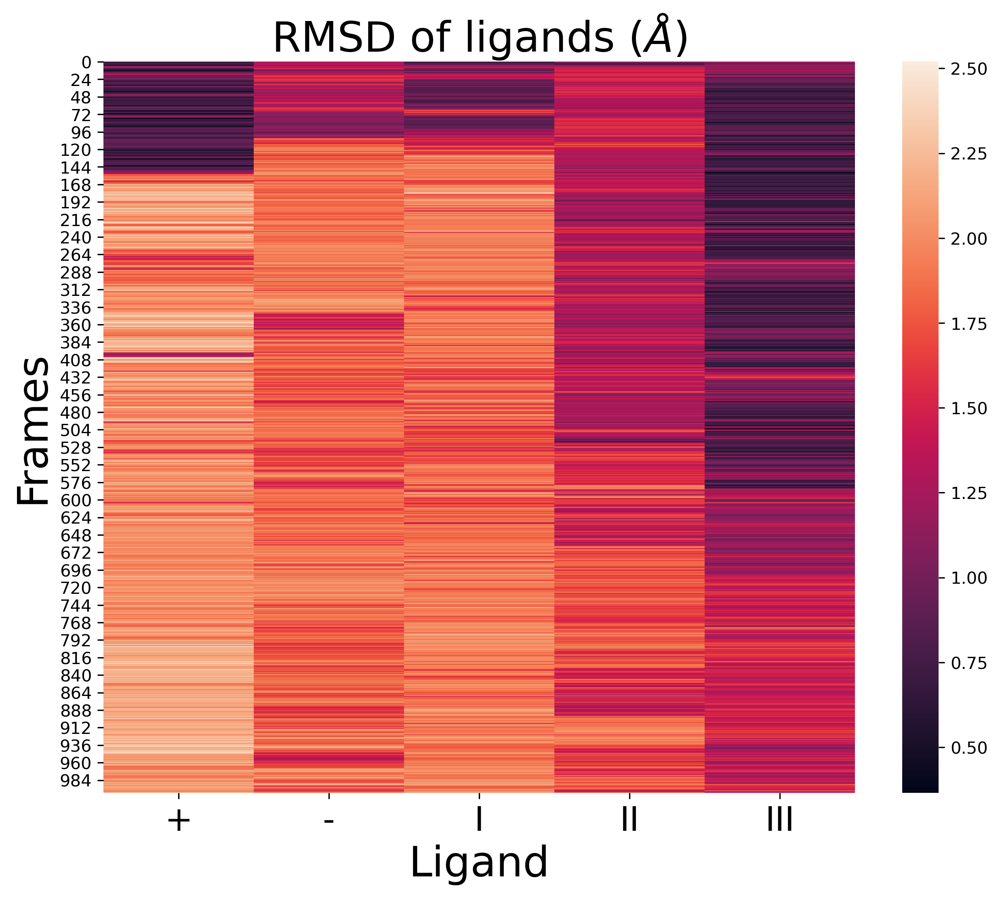

In [57]:
fig = plt.figure(figsize=[10,8],dpi=300)
RMSDligandheatmap=ligrmsd.T.loc[:,['rmsd_xtallig','rmsd_decoylig','rmsd_liglig1','rmsd_liglig2','rmsd_liglig3']]
RMSDligandheatmap.columns=['+','-','I','II','III']

sns.heatmap(RMSDligandheatmap)
plt.tick_params(axis='x',which='both',labelsize=25)
plt.ylabel("Frames",fontsize=25)
plt.xlabel("Ligand",fontsize=25)
plt.title('RMSD of ligands ($\AA$)',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=10)
fig.savefig('RMSDlig_heatmap.png',dpi=300)
plt.show()

In [58]:
##Crystal structure
hbxtal = np.loadtxt("hbxtal_protlig.xvg",comments=['#','@'],unpack=True)
hbxtal=pd.DataFrame(hbxtal)
hbxtal=hbxtal.T
hbxtal.columns=['Time (ps)','hb_xtal','Pairs']
hbxtal

##Ligand 1
hblig1= np.loadtxt("hblig1_protlig.xvg",comments=['#','@'],unpack=True)
hblig1= pd.DataFrame(hblig1)
hblig1=hblig1.T
hblig1.columns=['Time (ps)','hb_lig1','Pairs']
hblig1

##Ligand 2
hblig2 = np.loadtxt("hblig2_protlig.xvg",comments=['#','@'],unpack=True)
hblig2= pd.DataFrame(hblig2)
hblig2=hblig2.T
hblig2.columns=['Time (ps)','hb_lig2','Pairs']
hblig2

##Ligand 3
hblig3= np.loadtxt("hblig3_protlig.xvg",comments=['#','@'],unpack=True)
hblig3= pd.DataFrame(hblig3)
hblig3=hblig3.T
hblig3.columns=['Time (ps)','hb_lig3','Pairs']
hblig3

##Decoy
hbdecoy = np.loadtxt("hbdecoy_protlig.xvg",comments=['#','@'],unpack=True)
hbdecoy= pd.DataFrame(hbdecoy)
hbdecoy=hbdecoy.T
hbdecoy.columns=['Time (ps)','hb_decoy','Pairs']
hbdecoy

##Concatenating data

hbond_df_sinmelt=pd.DataFrame([hbxtal['Time (ps)'],hbxtal['hb_xtal'],
                       hbdecoy['hb_decoy'],hblig1['hb_lig1'],
                       hblig2['hb_lig2'],hblig3['hb_lig3']])
hbond_df=hbond_df_sinmelt.T.melt('Time (ps)',var_name='hb',value_name='vals')
hbond_df

,Time (ps),hb,vals
0,0.0,hb_xtal,10.0
1,10.0,hb_xtal,10.0
2,20.0,hb_xtal,12.0
3,30.0,hb_xtal,10.0
4,40.0,hb_xtal,9.0
...,...,...,...
25000,49960.0,hb_lig3,1.0
25001,49970.0,hb_lig3,3.0
25002,49980.0,hb_lig3,2.0
25003,49990.0,hb_lig3,1.0


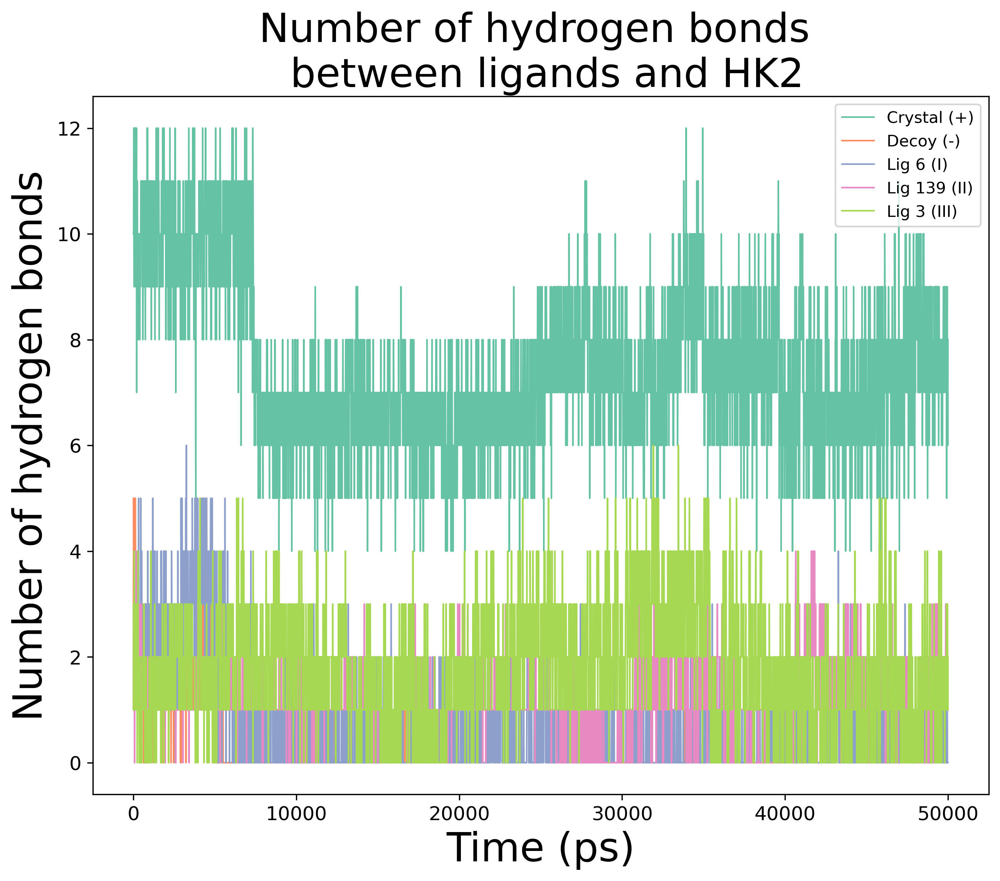

In [59]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.lineplot(x='Time (ps)',y='vals',data=hbond_df,hue='hb',palette='Set2',linewidth=1)

plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=10)

plt.ylabel("Number of hydrogen bonds",fontsize=25)
plt.xlabel("Time (ps)",fontsize=25)
plt.title('Number of hydrogen bonds \n between ligands and HK2',
          fontsize=25)
plt.tick_params(axis='x',labelsize='large')
plt.tick_params(axis='y',labelsize='large')

plt.show()
fig.savefig('hbond.png',dpi=300)

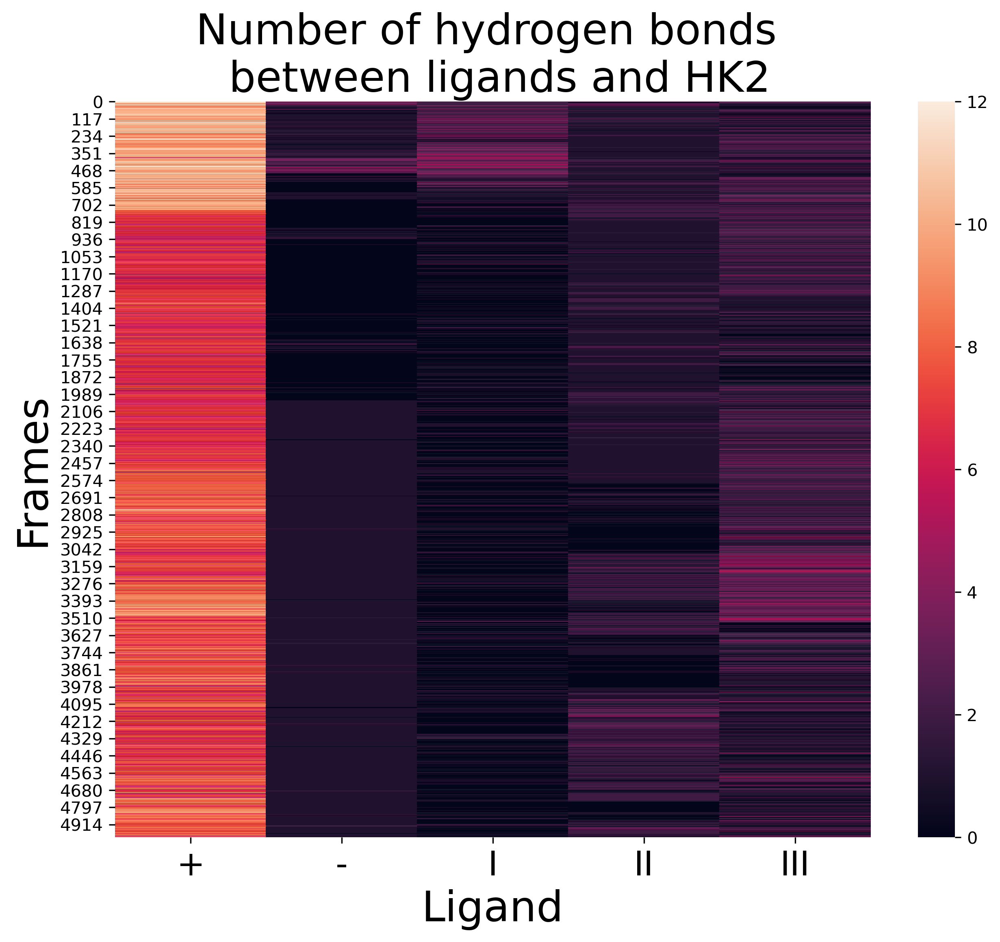

In [60]:
fig = plt.figure(figsize=[10,8],dpi=300)
hbheatmap=hbond_df_sinmelt.T.loc[:,['hb_xtal','hb_decoy','hb_lig1','hb_lig2','hb_lig3']]
hbheatmap.columns=['+','-','I','II','III']

sns.heatmap(hbheatmap)
plt.tick_params(axis='x',which='both',labelsize=25)
plt.ylabel("Frames",fontsize=25)
plt.xlabel("Ligand",fontsize=25)
plt.title('Number of hydrogen bonds \n between ligands and HK2',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=10)
fig.savefig('hb_heatmap.png',dpi=300)

plt.show()

# Radial distribution function for solvation shell

In [61]:
##gmx_mpi rdf -f md-0_10noPBC.xtc -s md_0_10.tpr -n index.ndx -ref 13 -sel 15 -selrpos part_res_com -seltype part_res_com

In [62]:
##Crystal structure
rdfxtal = np.loadtxt("rdf_xtal.xvg",comments=['#','@'],unpack=True)
rdfxtal=pd.DataFrame(rdfxtal)
rdfxtal=rdfxtal.T
rdfxtal.columns=['r (nm)','rdf_xtal']
rdfxtal

,r (nm),rdf_xtal
0,0.000,0.000
1,0.002,0.000
2,0.004,0.000
3,0.006,0.000
4,0.008,0.000
...,...,...
3826,7.652,1.023
3827,7.654,1.023
3828,7.656,1.021
3829,7.658,1.023


In [63]:
##Ligand 1
rdflig1= np.loadtxt("rdf_lig1.xvg",comments=['#','@'],unpack=True)
rdflig1= pd.DataFrame(rdflig1)
rdflig1=rdflig1.T
rdflig1.columns=['r (nm)','rdf_lig1']
rdflig1

,r (nm),rdf_lig1
0,0.000,0.000
1,0.002,0.000
2,0.004,0.000
3,0.006,0.000
4,0.008,0.000
...,...,...
3827,7.654,1.012
3828,7.656,1.009
3829,7.658,1.011
3830,7.660,1.008


In [64]:
##Ligand 2
rdflig2 = np.loadtxt("rdf_lig2.xvg",comments=['#','@'],unpack=True)
rdflig2= pd.DataFrame(rdflig2)
rdflig2=rdflig2.T
rdflig2.columns=['r (nm)','rdf_lig2']
rdflig2

,r (nm),rdf_lig2
0,0.000,0.000
1,0.002,0.000
2,0.004,0.000
3,0.006,0.000
4,0.008,0.000
...,...,...
3826,7.652,1.021
3827,7.654,1.020
3828,7.656,1.018
3829,7.658,1.021


In [65]:
##Ligand 3
rdflig3= np.loadtxt("rdf_lig3.xvg",comments=['#','@'],unpack=True)
rdflig3= pd.DataFrame(rdflig3)
rdflig3=rdflig3.T
rdflig3.columns=['r (nm)','rdf_lig3']
rdflig3

,r (nm),rdf_lig3
0,0.000,0.000
1,0.002,0.000
2,0.004,0.000
3,0.006,0.000
4,0.008,0.000
...,...,...
3827,7.654,1.018
3828,7.656,1.020
3829,7.658,1.018
3830,7.660,1.016


In [66]:
##Decoy
rdfdecoy = np.loadtxt("rdf_decoy.xvg",comments=['#','@'],unpack=True)
rdfdecoy= pd.DataFrame(rdfdecoy)
rdfdecoy=rdfdecoy.T
rdfdecoy.columns=['r (nm)','rdf_decoy']
rdfdecoy

,r (nm),rdf_decoy
0,0.000,0.000
1,0.002,0.000
2,0.004,0.000
3,0.006,0.000
4,0.008,0.000
...,...,...
3828,7.656,1.016
3829,7.658,1.017
3830,7.660,1.016
3831,7.662,1.014


In [67]:
##Concatenating data

rdf_df_nomelt=pd.DataFrame([rdfxtal['r (nm)'],rdfxtal['rdf_xtal'],
                       rdfdecoy['rdf_decoy'],rdflig1['rdf_lig1'],
                       rdflig2['rdf_lig2'],rdflig3['rdf_lig3']])
rdf_df=rdf_df_nomelt.T.melt('r (nm)',var_name='rdf',value_name='vals')
rdf_df=rdf_df.dropna()
rdf_df['r (nm)']=rdf_df['r (nm)']*10
rdf_df.columns=['r (A)', 'rdf','vals']
rdf_df

,r (A),rdf,vals
0,0.00,rdf_xtal,0.000
1,0.02,rdf_xtal,0.000
2,0.04,rdf_xtal,0.000
3,0.06,rdf_xtal,0.000
4,0.08,rdf_xtal,0.000
...,...,...,...
19158,76.52,rdf_lig3,1.017
19159,76.54,rdf_lig3,1.018
19160,76.56,rdf_lig3,1.020
19161,76.58,rdf_lig3,1.018


In [68]:
rdf_df_nomelt=rdf_df_nomelt.T.dropna()
rdf_df_nomelt['r (nm)']=rdf_df_nomelt['r (nm)']*10
rdf_df_nomelt.columns=['r (A)','rdf_xtal','rdf_decoy','rdf_lig1','rdf_lig2','rdf_lig3']
rdf_df_nomelt

,r (A),rdf_xtal,rdf_decoy,rdf_lig1,rdf_lig2,rdf_lig3
0,0.00,0.000,0.000,0.000,0.000,0.000
1,0.02,0.000,0.000,0.000,0.000,0.000
2,0.04,0.000,0.000,0.000,0.000,0.000
3,0.06,0.000,0.000,0.000,0.000,0.000
4,0.08,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...
3826,76.52,1.023,1.021,1.005,1.021,1.017
3827,76.54,1.023,1.018,1.012,1.020,1.018
3828,76.56,1.021,1.016,1.009,1.018,1.020
3829,76.58,1.023,1.017,1.011,1.021,1.018


In [69]:
rdf_df_nomelt[['rdf_xtal','rdf_decoy','rdf_lig1','rdf_lig2','rdf_lig3']]=rdf_df_nomelt[['rdf_xtal','rdf_decoy','rdf_lig1','rdf_lig2','rdf_lig3']].rolling(window=50).mean()
rdf_df_nomelt 

,r (A),rdf_xtal,rdf_decoy,rdf_lig1,rdf_lig2,rdf_lig3
0,0.00,NaN,NaN,NaN,NaN,NaN
1,0.02,NaN,NaN,NaN,NaN,NaN
2,0.04,NaN,NaN,NaN,NaN,NaN
3,0.06,NaN,NaN,NaN,NaN,NaN
4,0.08,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
3826,76.52,1.02384,1.01592,1.00970,1.01904,1.01840
3827,76.54,1.02376,1.01592,1.00974,1.01896,1.01838
3828,76.56,1.02368,1.01602,1.00980,1.01898,1.01846
3829,76.58,1.02374,1.01606,1.00982,1.01898,1.01844


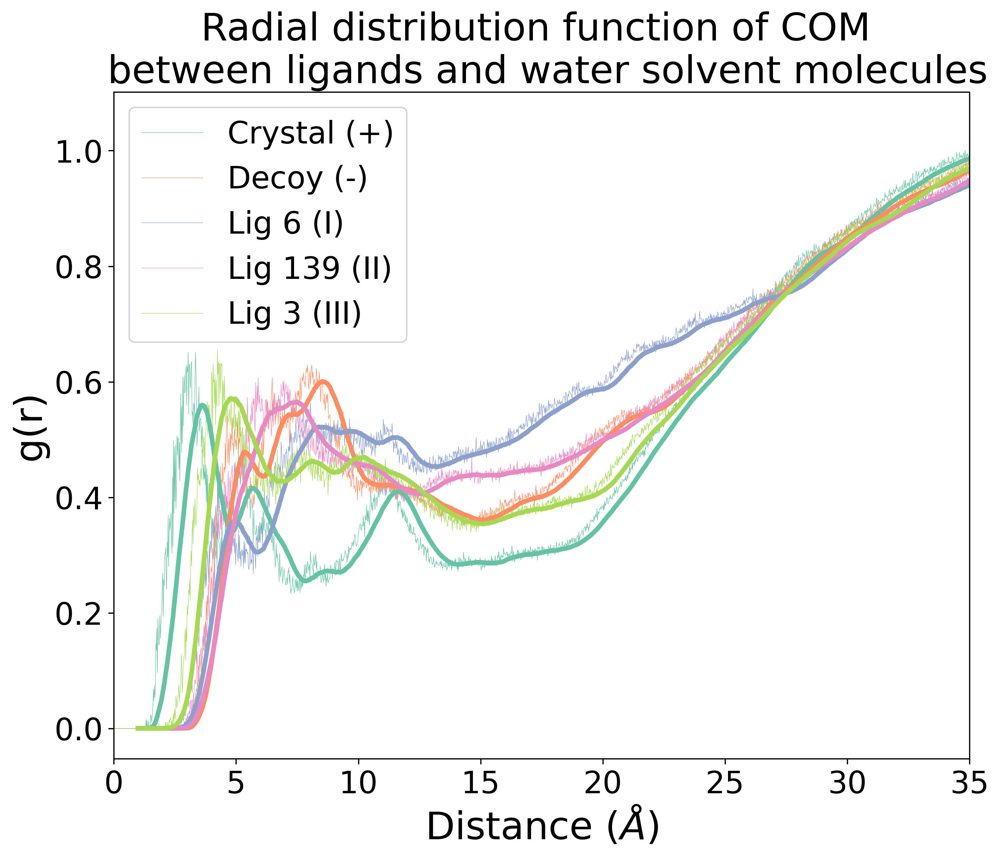

In [70]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.lineplot(x='r (A)',y='vals',data=rdf_df,hue='rdf',palette='Set2',linewidth=0.3)

rdf_df_nomelt_avering=rdf_df_nomelt.melt('r (A)',var_name='rdf',value_name='vals_aver')
rdfplot=sns.lineplot(x='r (A)',y='vals_aver',data=rdf_df_nomelt_avering,hue='rdf',palette='Set2',linewidth=3)

plt.ylabel("g(r)",fontsize=25)
plt.xlabel("Distance ($\AA$)",fontsize=25)
plt.title('Radial distribution function of COM \n between ligands and water solvent molecules',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.xlim(0,35)

rdfplot.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=20)

plt.show()
fig.savefig('rdf.png',dpi=300)

## Coordination number

In [71]:
cn_xtal=pd.DataFrame(np.cumsum(rdfxtal['rdf_xtal']))
cn_xtal.drop(cn_xtal.tail(3).index,inplace=True)
cn_xtal

cn_decoy=pd.DataFrame(np.cumsum(rdfdecoy['rdf_decoy']))
cn_decoy.drop(cn_decoy.tail(5).index,inplace=True)
cn_decoy

cn_lig1=pd.DataFrame(np.cumsum(rdflig1['rdf_lig1']))
cn_lig1.drop(cn_lig1.tail(4).index,inplace=True)
cn_lig1

cn_lig2=pd.DataFrame(np.cumsum(rdflig2['rdf_lig2']))
cn_lig2.drop(cn_lig2.tail(3).index,inplace=True)
cn_lig2

cn_lig3=pd.DataFrame(np.cumsum(rdflig3['rdf_lig3']))
cn_lig3.drop(cn_lig3.tail(4).index,inplace=True)
cn_lig3

radius=pd.DataFrame(rdfxtal['r (nm)']*10)
radius.columns=['r']
radius.drop(radius.tail(3).index,inplace=True)
radius

cn_df=pd.concat([radius,cn_xtal,cn_decoy,cn_lig1,cn_lig2,cn_lig3],axis=1).iloc[0:500,:]
cn_df

,r,rdf_xtal,rdf_decoy,rdf_lig1,rdf_lig2,rdf_lig3
0,0.00,0.000,0.000,0.000,0.000,0.000
1,0.02,0.000,0.000,0.000,0.000,0.000
2,0.04,0.000,0.000,0.000,0.000,0.000
3,0.06,0.000,0.000,0.000,0.000,0.000
4,0.08,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...
495,9.90,142.885,153.980,138.214,149.645,163.307
496,9.92,143.200,154.416,138.717,150.121,163.771
497,9.94,143.518,154.850,139.209,150.585,164.236
498,9.96,143.838,155.245,139.707,151.035,164.709


In [72]:
cn_melt=cn_df.melt('r',var_name='rdf',value_name='vals')
cn_melt

,r,rdf,vals
0,0.00,rdf_xtal,0.000
1,0.02,rdf_xtal,0.000
2,0.04,rdf_xtal,0.000
3,0.06,rdf_xtal,0.000
4,0.08,rdf_xtal,0.000
...,...,...,...
2495,9.90,rdf_lig3,163.307
2496,9.92,rdf_lig3,163.771
2497,9.94,rdf_lig3,164.236
2498,9.96,rdf_lig3,164.709


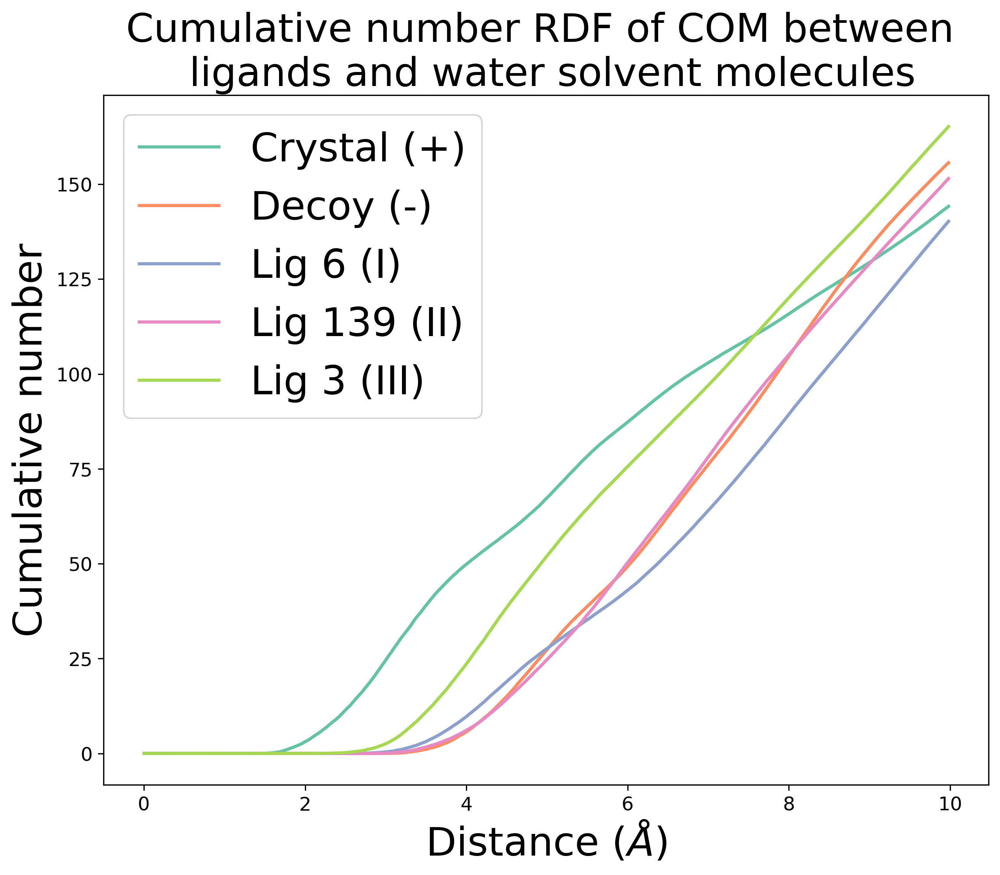

In [73]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.lineplot(x='r',y='vals',data=cn_melt,hue='rdf',palette='Set2',linewidth=2)
plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=25)
plt.ylabel("Cumulative number",fontsize=25)
plt.xlabel("Distance ($\AA$)",fontsize=25)
plt.title('Cumulative number RDF of COM between \n ligands and water solvent molecules',
          fontsize=25)
plt.tick_params(axis='x',labelsize='large')
plt.tick_params(axis='y',labelsize='large')
plt.show()
fig.savefig('cumrdf.png',dpi=300)

In [74]:
area_cn=pd.DataFrame(cn_df.iloc[:,1:6].apply(np.trapz,axis=0))
area_cn.columns=['Average number']
area_cn=area_cn.T
area_cn.columns=['Crystal stru. (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)']
area_cn

,Crystal stru. (+),Decoy (-),Lig 6 (I),Lig 139 (II),Lig 3 (III)
Average number,32445.0735,23502.254,20751.8995,23224.272,29565.963


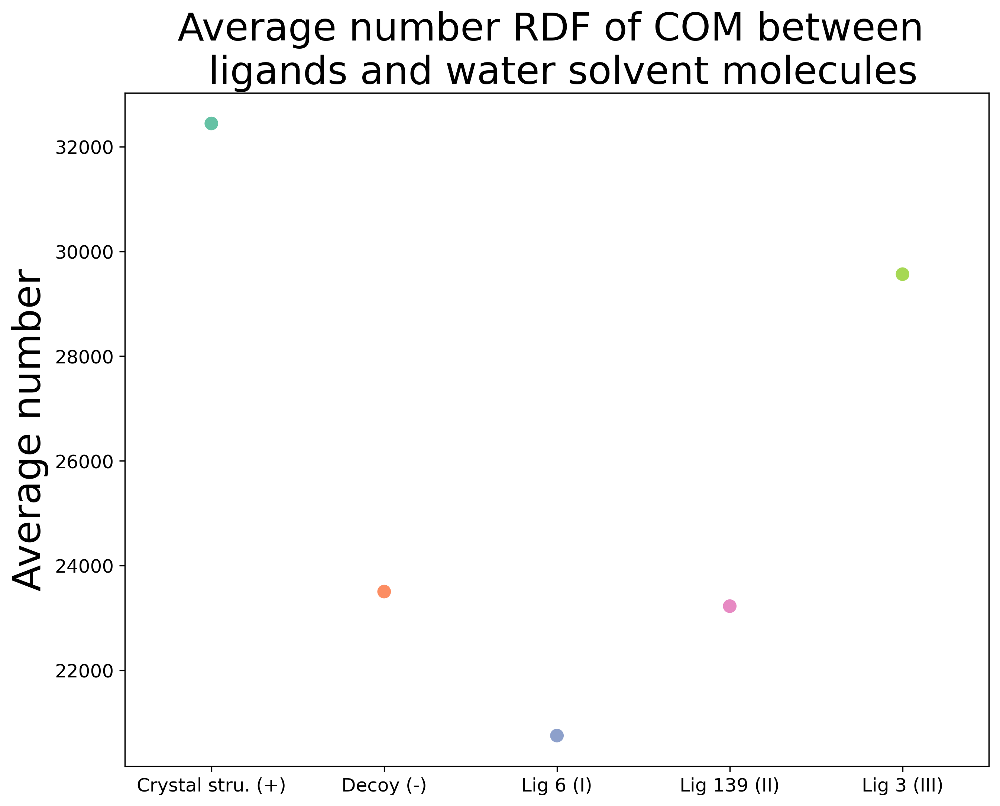

In [75]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.pointplot(data=area_cn,palette='Set2')

plt.ylabel("Average number",fontsize=25)
#plt.xlabel("Distance ($\AA$)",fontsize=25)
plt.title('Average number RDF of COM between \n ligands and water solvent molecules',
          fontsize=25)

plt.tick_params(axis='x',labelsize='large')
plt.tick_params(axis='y',labelsize='large')

fig.savefig('averdf.png',dpi=300)

# Hydrogend bond occupancy percentage analysis

In [76]:
##gmx_mpi hbond -f md_0_10noPBC.xtc -s md_0_10.tpr -num hbnumb_prot_lig.xvg -hbn hbond.ndx -hbm hbmap.xpm
##sed -n '/\[ hbonds_Protein-MOL \]/,$p' hbond.ndx > hbond_corrected.ndx 
##perl plot_hbmap_generic.pl -s crystal_lig3hb.pdb -map hbmap.xpm -index hbond_corrected.ndx
##gmx_mpi editconf -f md_0_10.tpr -n index.ndx -o crystal_decoyhb.pdb -pbc
##gmx_mpi editconf -f md_0_10.tpr -n index.ndx -o crystal_xtalhb.pdb -pbc
##gmx_mpi editconf -f md_0_10.tpr -n index.ndx -o crystal_lig1hb.pdb -pbc
##gmx_mpi editconf -f md_0_10.tpr -n index.ndx -o crystal_lig2hb.pdb -pbc
##gmx_mpi editconf -f md_0_10.gro -n index.ndx -o crystal_lig3hb.pdb -pbc

In [77]:
import glob 

path=r'/media/edward/ADATA HD330/Corridas_ABACO/C-terminal/Statistic_Analysis'

all_files_used=glob.glob(path + '/*.dat')

li=[]

for filename in all_files_used:
    df=pd.read_csv(filename,index_col=None, header=0,delim_whitespace=True)
    li.append(df)
frame=pd.concat(li,axis=0,ignore_index=True)
frame['Per_Exist']=pd.to_numeric(frame['Per_Exist'],downcast='float')
hb_curated=frame.sort_values(by=['Per_Exist'],ascending=False)
hb_curated.Donor=hb_curated.Donor.replace(['XTAL_912','DECOY_912','LIG1_912','LIG2_1807','LIG3_1807'],['(+)','(-)','Lig I','Lig II','Lig III'])
hb_curated.Acceptor=hb_curated.Acceptor.replace(['XTAL_912','DECOY_912','LIG1_912','LIG2_1807','LIG3_1807'],['(+)','(-)','Lig I','Lig II','Lig III'])
hb_curated=hb_curated.head(n=25)
hb_curated

,Donor,Donor_at,Acceptor,Acceptor_at,Per_Exist
158,ASN683,HA,(+),O4,98.500000
144,ASN656,HA,(+),O4,98.279999
176,(+),O4,ASN656,H,96.761002
157,ASN683,HA,(+),O3,91.202003
170,(+),O1,GLUH742,HB1,89.622002
108,LYS621,NZ,Lig III,N3,68.466003
154,GLY681,N,(+),O26,64.126999
10,ASN706,HA,(-),C24,58.748001
68,THR620,OG1,Lig II,O1,50.349998
142,THR620,HG1,(+),O23,49.209999


## Most important interactions according to experimental data

In [78]:
#hb_curated.loc[hb_curated['Donor']=='LYS621']
hb_curated.loc[hb_curated['Acceptor']=='LYS621']

,Donor,Donor_at,Acceptor,Acceptor_at,Per_Exist


In [79]:
#hb_curated.loc[hb_curated['Donor']=='GLUH708']
hb_curated.loc[hb_curated['Acceptor']=='GLUH708']

,Donor,Donor_at,Acceptor,Acceptor_at,Per_Exist
172,(+),N2,GLUH708,HB2,12.438


In [80]:
#hb_curated.loc[hb_curated['Donor']=='PRO605']
hb_curated.loc[hb_curated['Acceptor']=='PRO605']

,Donor,Donor_at,Acceptor,Acceptor_at,Per_Exist


In [81]:
#hb_curated.loc[hb_curated['Donor']=='GLN739']
hb_curated.loc[hb_curated['Acceptor']=='GLN739']

,Donor,Donor_at,Acceptor,Acceptor_at,Per_Exist
169,(+),O1,GLN739,HB1,16.257


In [82]:
hb_curated.loc[hb_curated['Donor']=='THR680']
#hb_curated.loc[hb_curated['Acceptor']=='THR680']

,Donor,Donor_at,Acceptor,Acceptor_at,Per_Exist
152,THR680,HG1,(+),O27,10.218


In [83]:
hb_curated['pair_occup']=hb_curated['Donor']+'-'+hb_curated['Donor_at']+' & '+hb_curated['Acceptor']+'-'+hb_curated['Acceptor_at']
hb_curated

,Donor,Donor_at,Acceptor,Acceptor_at,Per_Exist,pair_occup
158,ASN683,HA,(+),O4,98.500000,ASN683-HA & (+)-O4
144,ASN656,HA,(+),O4,98.279999,ASN656-HA & (+)-O4
176,(+),O4,ASN656,H,96.761002,(+)-O4 & ASN656-H
157,ASN683,HA,(+),O3,91.202003,ASN683-HA & (+)-O3
170,(+),O1,GLUH742,HB1,89.622002,(+)-O1 & GLUH742-HB1
108,LYS621,NZ,Lig III,N3,68.466003,LYS621-NZ & Lig III-N3
154,GLY681,N,(+),O26,64.126999,GLY681-N & (+)-O26
10,ASN706,HA,(-),C24,58.748001,ASN706-HA & (-)-C24
68,THR620,OG1,Lig II,O1,50.349998,THR620-OG1 & Lig II-O1
142,THR620,HG1,(+),O23,49.209999,THR620-HG1 & (+)-O23


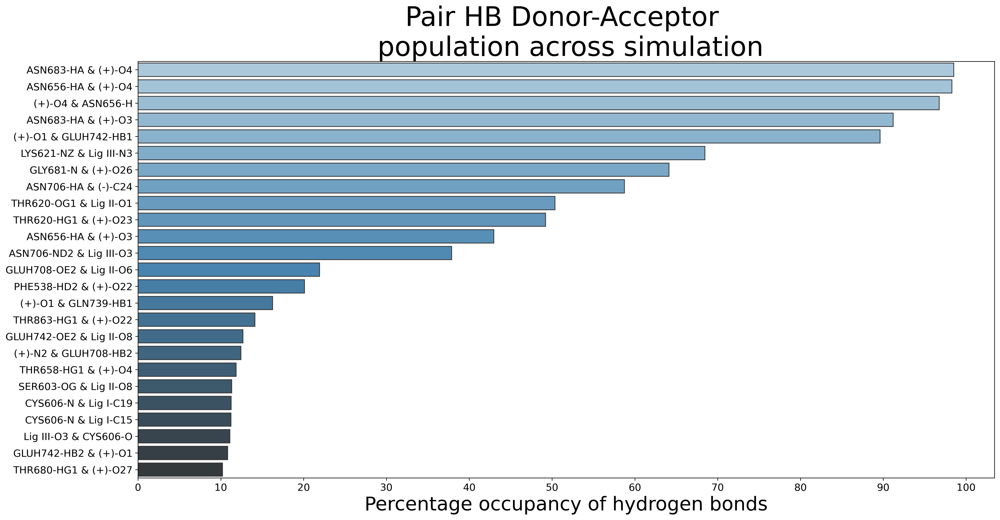

In [145]:
fig = plt.figure(figsize=[20,10],dpi=300)

#sns.color_palette('Spectral',16)

fig=sns.barplot(y='pair_occup',x='Per_Exist',palette='Blues_d',data=hb_curated,ci=None,edgecolor='.2')

plt.tick_params(axis='both',which='both',labelsize=13)

plt.ylabel("",fontsize=18)
plt.xlabel("Percentage occupancy of hydrogen bonds",fontsize=25)
plt.title('Pair HB Donor-Acceptor \n population across simulation',fontsize=35)
plt.xticks(np.arange(0,105,10))
plt.savefig('HB_total.png',dpi=300)

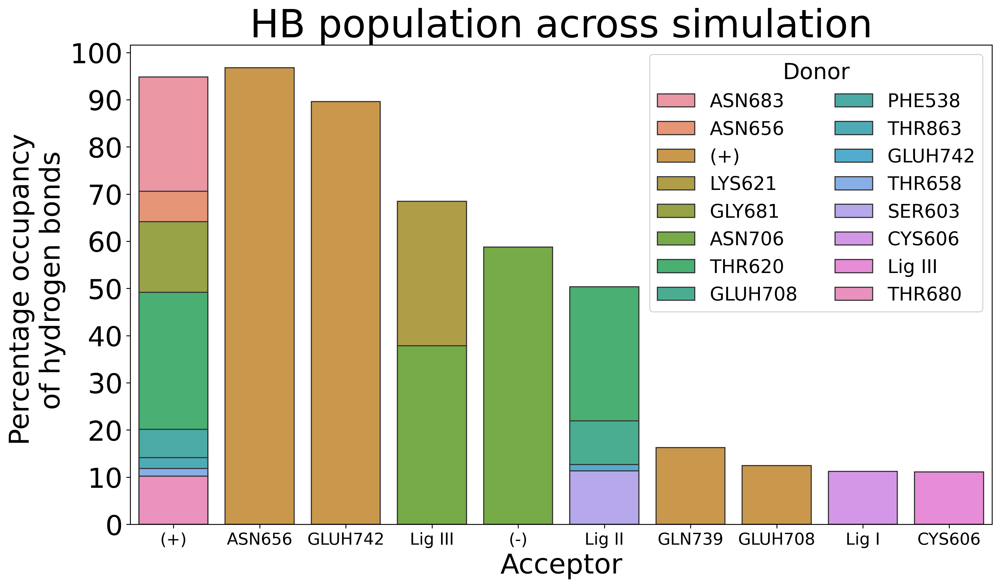

In [85]:
fig = plt.figure(figsize=[14,8],dpi=300)
sns.color_palette('Spectral',16)
fig=sns.barplot(x='Acceptor',y='Per_Exist',hue='Donor',data=hb_curated,ci=None,dodge=False,edgecolor='.2')

plt.tick_params(axis='y',which='both',labelsize=25)
plt.tick_params(axis='x',which='both',labelsize=15)

plt.ylabel("Percentage occupancy \n of hydrogen bonds",fontsize=25)
plt.xlabel("Acceptor",fontsize=25)
plt.title('HB population across simulation',fontsize=35)
plt.yticks(np.arange(0,105,10))
plt.legend(title='Donor',loc='upper right',fontsize=17,ncol=2,title_fontsize=20)
plt.savefig('Donor_Acceptor.png',dpi=300)

([<matplotlib.axis.XTick at 0x7f78fa124ef0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

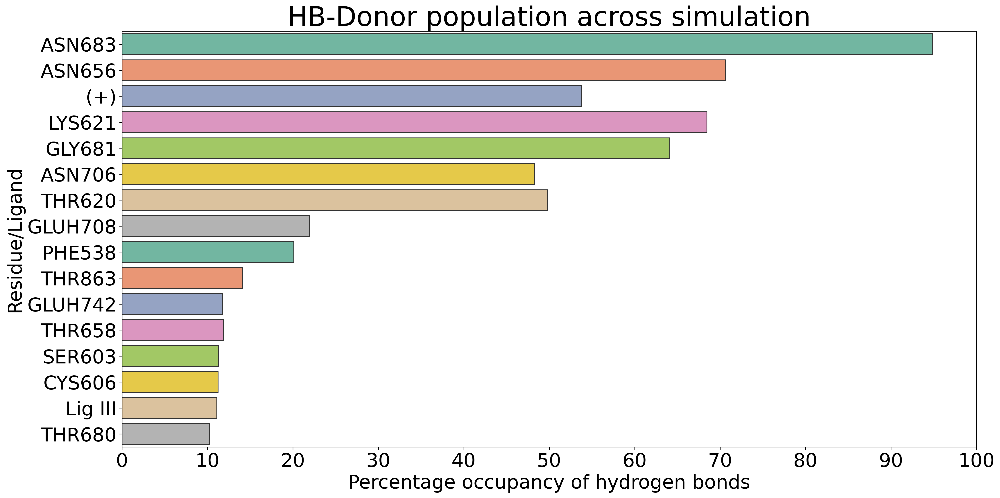

In [86]:
fig = plt.figure(figsize=[20,10],dpi=300)

fig=sns.barplot(y='Donor',x='Per_Exist',data=hb_curated,palette='Set2',ci=None,edgecolor='.2')

plt.tick_params(axis='both',which='both',labelsize=25)

plt.ylabel("Residue/Ligand",fontsize=25)
plt.xlabel("Percentage occupancy of hydrogen bonds",fontsize=25)
plt.title('HB-Donor population across simulation',fontsize=35)
plt.xticks(np.arange(0,105,10))


## Contact analysis

## K621

In [87]:
K621C=pd.read_csv('K621_XTAl.csv',index_col=0)
K621D=pd.read_csv('K621_DECOY.csv',index_col=0)
K621I=pd.read_csv('K621_LIG1.csv',index_col=0)
K621II=pd.read_csv('K621_LIG2.csv',index_col=0)
K621III=pd.read_csv('K621_LIG3.csv',index_col=0)

K621_contact=pd.concat([K621C,K621D['Number of contacts'],K621I['Number of contacts'],K621II['Number of contacts'],K621III['Number of contacts']],axis=1)
K621_contact.columns=['Time','+','-','I','II','III']
K621_contact_melt=K621_contact.melt('Time',var_name='contacts',value_name='vals')


<Figure size 3000x2400 with 0 Axes>

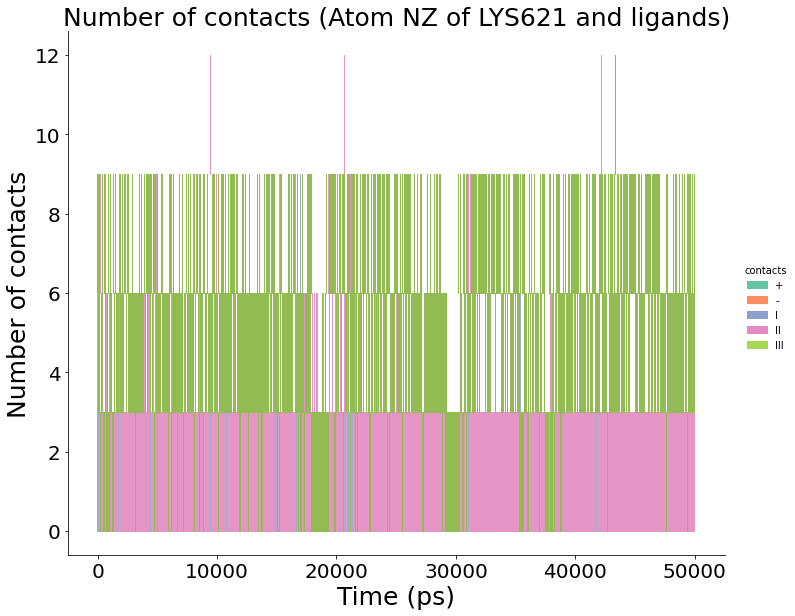

In [88]:
fig = plt.figure(figsize=[10,8],dpi=300)
sns.displot(x='Time',y='vals',data=K621_contact_melt,hue='contacts',palette='Set2',binwidth=3,height=8,aspect=1.25)
plt.xlabel("Time (ps)",fontsize=25)
plt.ylabel("Number of contacts",fontsize=25)
plt.title('Number of contacts (Atom NZ of LYS621 and ligands)',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()

#fig.savefig('hbond.png',dpi=300)

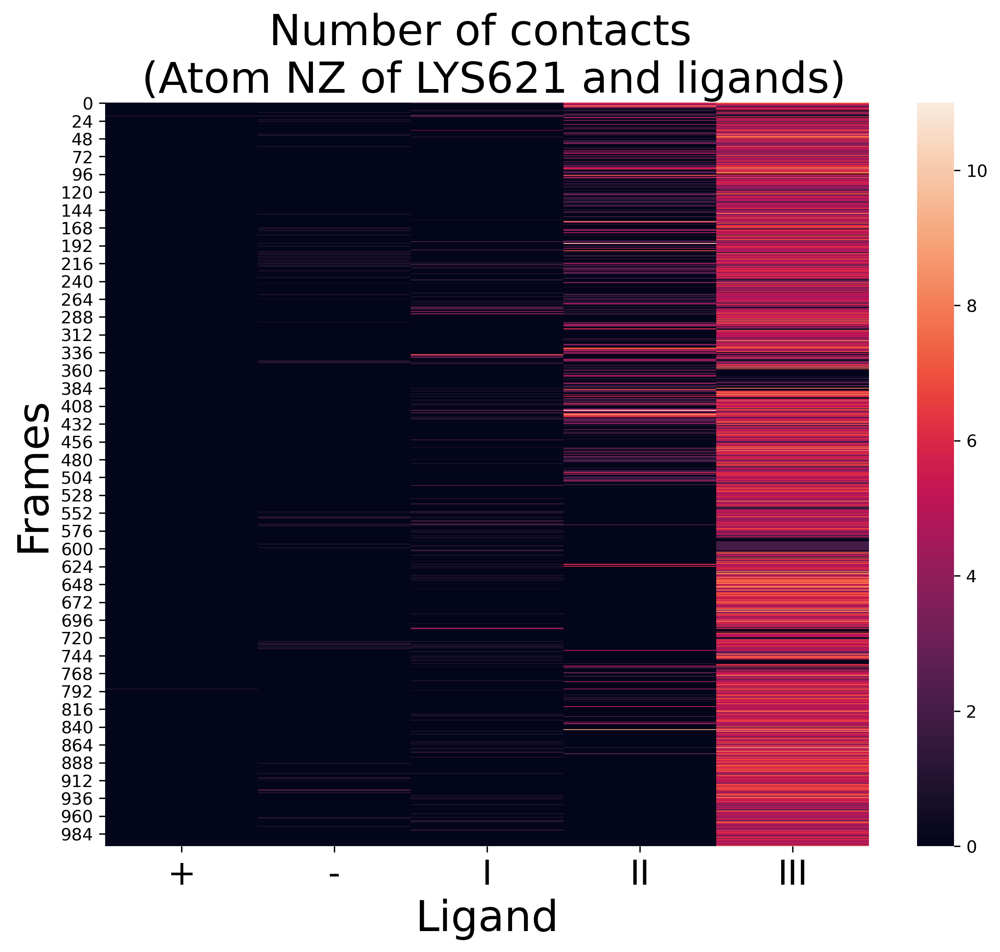

In [89]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.heatmap(K621_contact.loc[:,['+','-','I','II','III']])
plt.tick_params(axis='x',which='both',labelsize=25)
plt.ylabel("Frames",fontsize=25)
plt.xlabel("Ligand",fontsize=25)
plt.title('Number of contacts \n (Atom NZ of LYS621 and ligands)',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=10)
plt.show()

fig.savefig('K621cont.png',dpi=300)

## E708

In [90]:
E708C=pd.read_csv('E708_XTAl.csv',index_col=0)
E708D=pd.read_csv('E708_DECOY.csv',index_col=0)
E708I=pd.read_csv('E708_LIG1.csv',index_col=0)
E708II=pd.read_csv('E708_LIG2.csv',index_col=0)
E708III=pd.read_csv('E708_LIG3.csv',index_col=0)

E708_contact=pd.concat([E708C,E708D['Number of contacts'],E708I['Number of contacts'],E708II['Number of contacts'],E708III['Number of contacts']],axis=1)
E708_contact.columns=['Time','+','-','I','II','III']
E708_contact_melt=E708_contact.melt('Time',var_name='contacts',value_name='vals')

<Figure size 3000x2400 with 0 Axes>

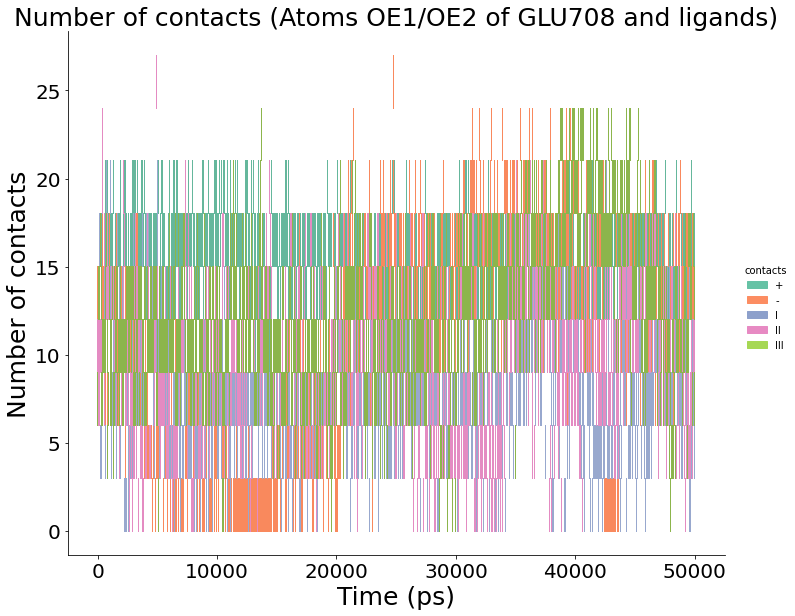

In [91]:
fig = plt.figure(figsize=[10,8],dpi=300)
sns.displot(x='Time',y='vals',data=E708_contact_melt,hue='contacts',palette='Set2',binwidth=3,height=8,aspect=1.25)
plt.xlabel("Time (ps)",fontsize=25)
plt.ylabel("Number of contacts",fontsize=25)
plt.title('Number of contacts (Atoms OE1/OE2 of GLU708 and ligands)',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()

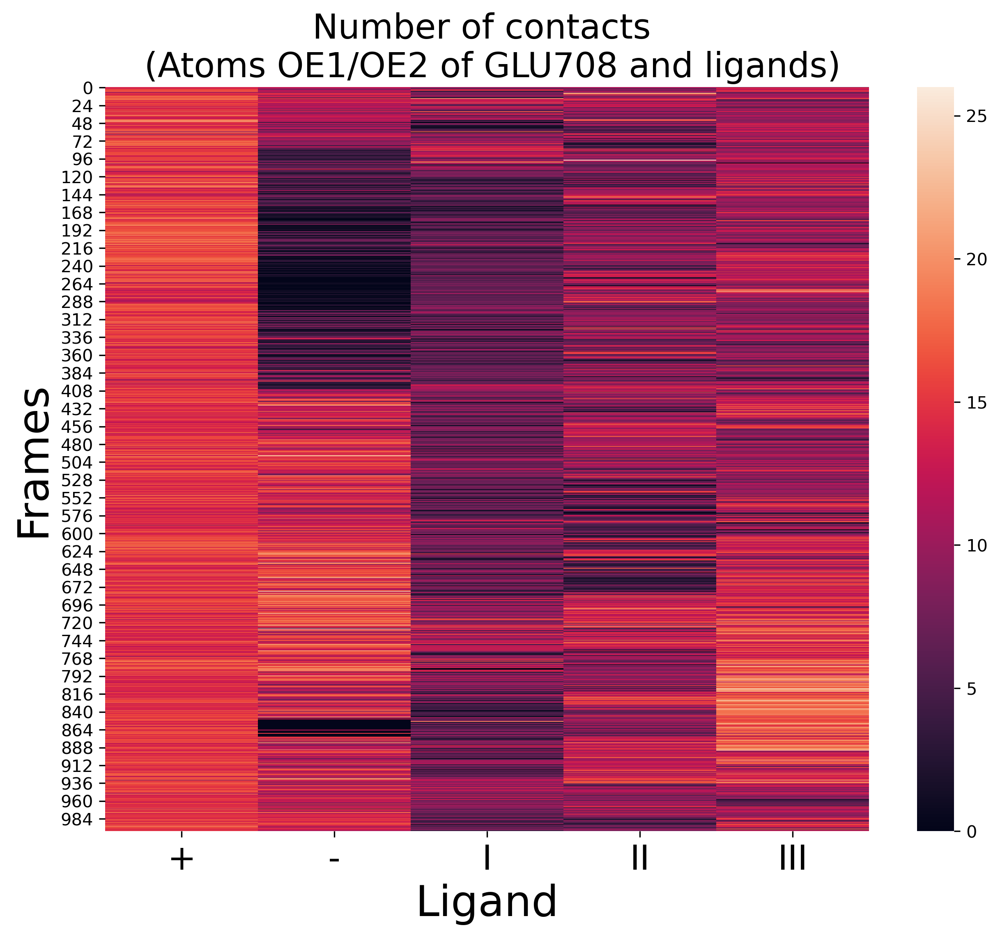

In [92]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.heatmap(E708_contact.loc[:,['+','-','I','II','III']])
plt.tick_params(axis='x',which='both',labelsize=25)
plt.ylabel("Frames",fontsize=25)
plt.xlabel("Ligand",fontsize=25)
plt.title('Number of contacts \n (Atoms OE1/OE2 of GLU708 and ligands)',fontsize=20)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=10)
plt.show()

fig.savefig('GLU708cont.png',dpi=300)

## P605

In [93]:
P605C=pd.read_csv('P605_XTAl.csv',index_col=0)
P605D=pd.read_csv('P605_DECOY.csv',index_col=0)
P605I=pd.read_csv('P605_LIG1.csv',index_col=0)
P605II=pd.read_csv('P605_LIG2.csv',index_col=0)
P605III=pd.read_csv('P605_LIG3.csv',index_col=0)

P605_contact=pd.concat([P605C,P605D['Number of contacts'],P605I['Number of contacts'],P605II['Number of contacts'],P605III['Number of contacts']],axis=1)
P605_contact.columns=['Time','+','-','I','II','III']
P605_contact_melt=P605_contact.melt('Time',var_name='contacts',value_name='vals')

<Figure size 3000x2400 with 0 Axes>

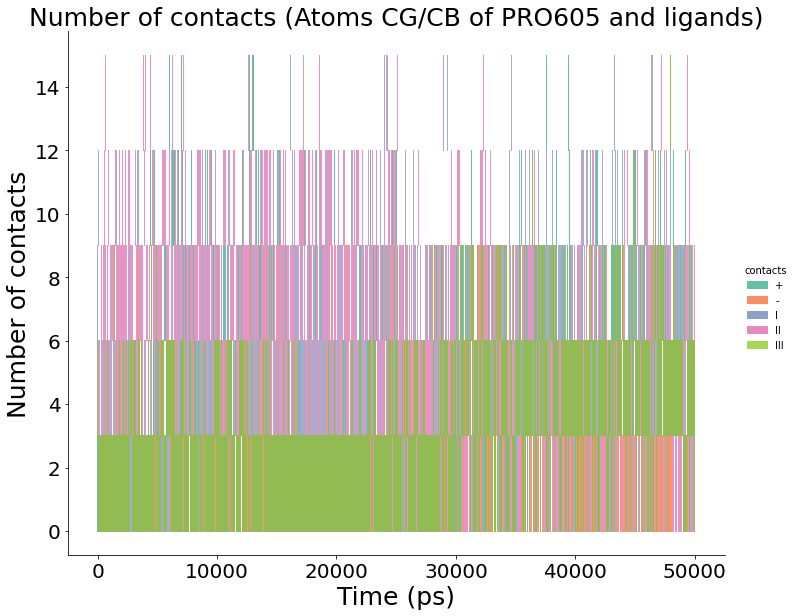

In [94]:
fig = plt.figure(figsize=[10,8],dpi=300)
sns.displot(x='Time',y='vals',data=P605_contact_melt,hue='contacts',palette='Set2',binwidth=3,height=8,aspect=1.25)
plt.xlabel("Time (ps)",fontsize=25)
plt.ylabel("Number of contacts",fontsize=25)
plt.title('Number of contacts (Atoms CG/CB of PRO605 and ligands)',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()

#fig.savefig('hbond.png',dpi=300)

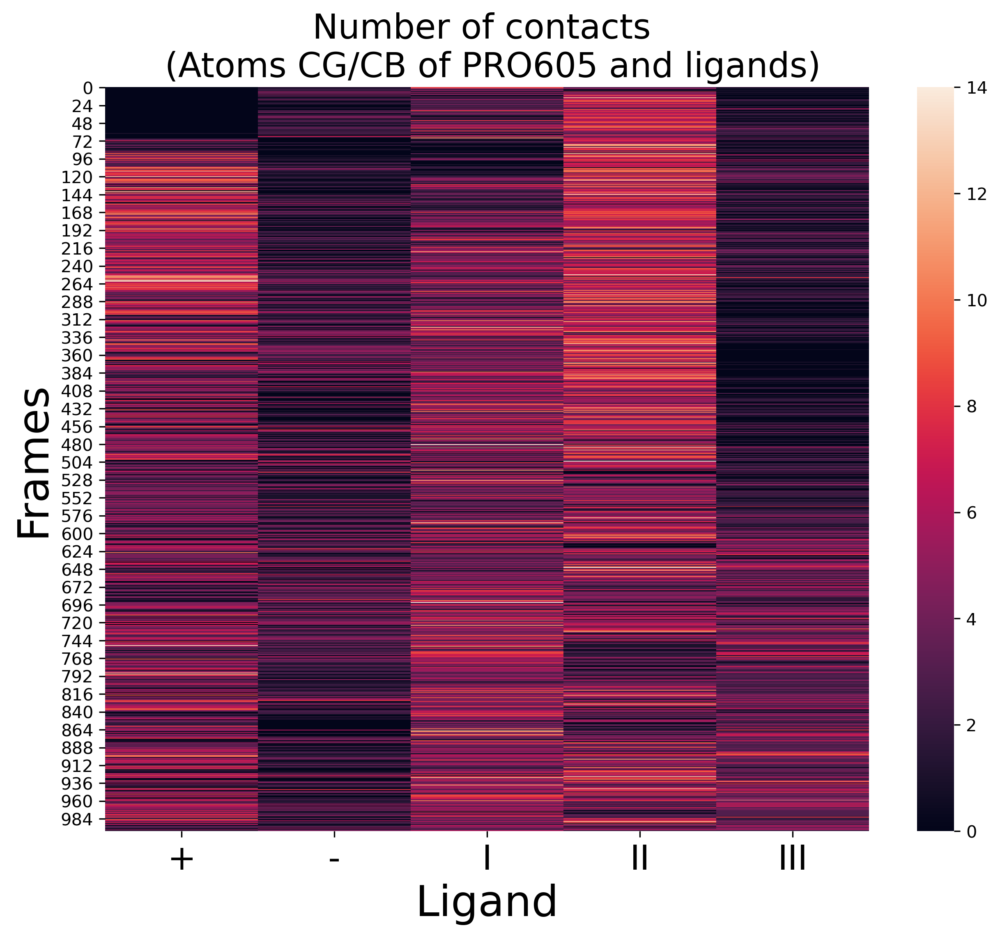

In [95]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.heatmap(P605_contact.loc[:,['+','-','I','II','III']])
plt.tick_params(axis='x',which='both',labelsize=25)
plt.ylabel("Frames",fontsize=25)
plt.xlabel("Ligand",fontsize=25)
plt.title('Number of contacts \n (Atoms CG/CB of PRO605 and ligands)',fontsize=20)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=10)
plt.show()
fig.savefig('PRO605cont.png',dpi=300)

## THR739

In [130]:
G739C=pd.read_csv('G739_XTAl.csv',index_col=0)
G739D=pd.read_csv('G739_DECOY.csv',index_col=0)
G739I=pd.read_csv('G739_LIG1.csv',index_col=0)
G739II=pd.read_csv('G739_LIG2.csv',index_col=0)
G739III=pd.read_csv('G739_LIG3.csv',index_col=0)

G739_contact=pd.concat([G739C,G739D['Number of contacts'],G739I['Number of contacts'],G739II['Number of contacts'],G739III['Number of contacts']],axis=1)
G739_contact.columns=['Time','+','-','I','II','III']
G739_contact_melt=G739_contact.melt('Time',var_name='contacts',value_name='vals')

<Figure size 3000x2400 with 0 Axes>

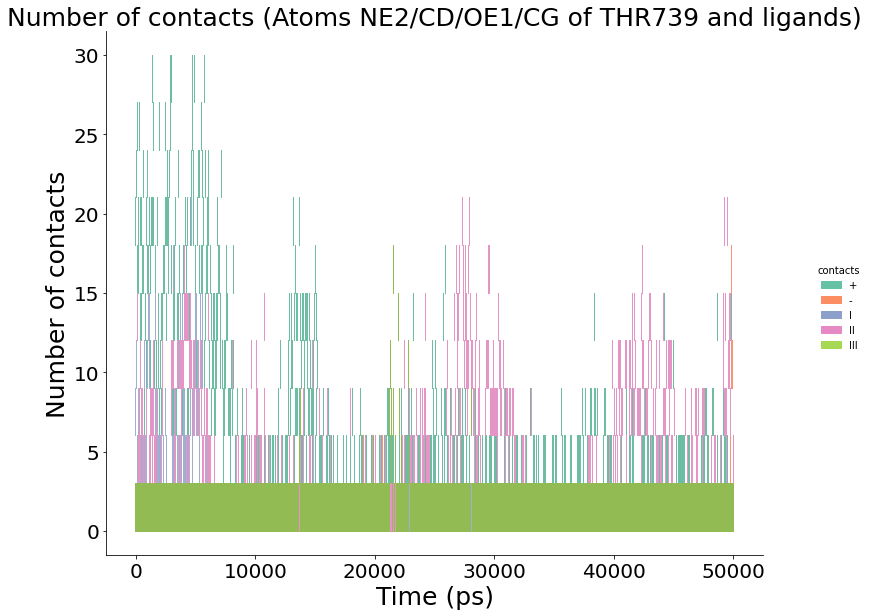

In [132]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.displot(x='Time',y='vals',data=G739_contact_melt,hue='contacts',palette='Set2',binwidth=3,height=8,aspect=1.25)
plt.xlabel("Time (ps)",fontsize=25)
plt.ylabel("Number of contacts",fontsize=25)
plt.title('Number of contacts (Atoms NE2/CD/OE1/CG of THR739 and ligands)',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()

#fig.savefig('hbond.png',dpi=300)

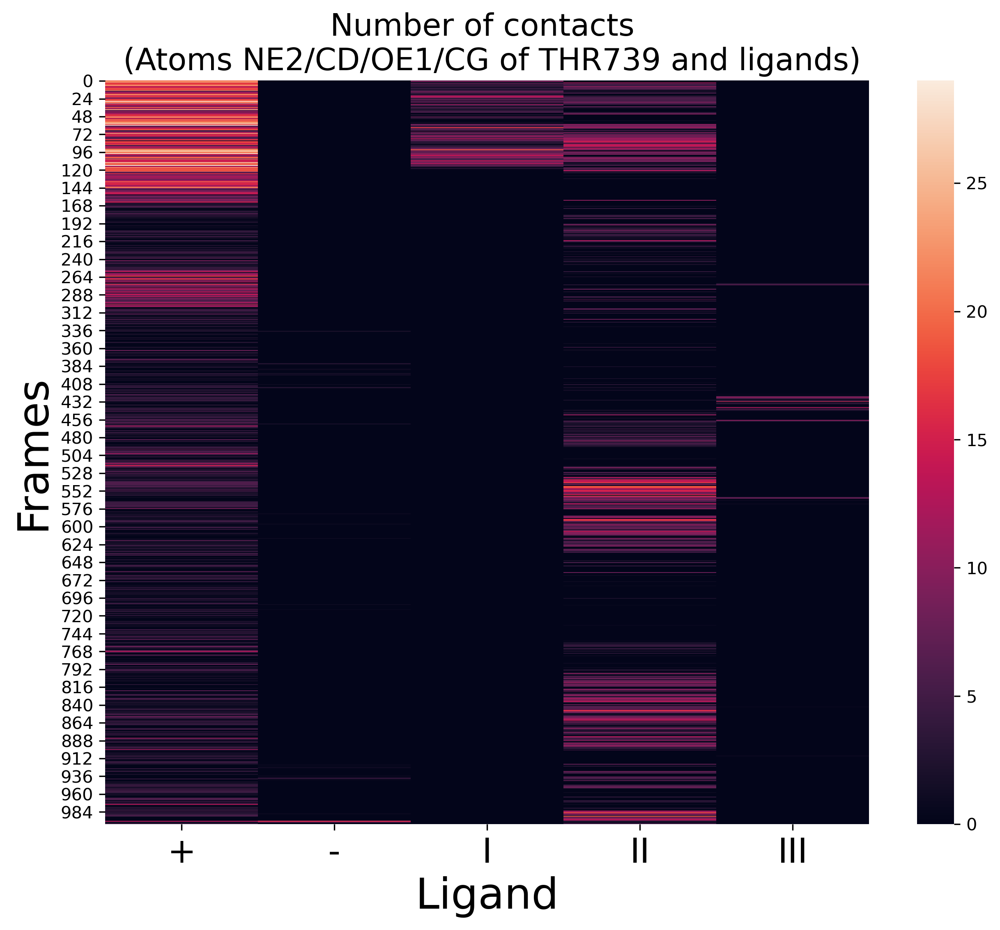

In [133]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.heatmap(G739_contact.loc[:,['+','-','I','II','III']])
plt.tick_params(axis='x',which='both',labelsize=25)
plt.ylabel("Frames",fontsize=25)
plt.xlabel("Ligand",fontsize=25)
plt.title('Number of contacts \n (Atoms NE2/CD/OE1/CG of THR739 and ligands)',fontsize=18)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=10)
plt.show()
fig.savefig('THR739cont.png',dpi=300)

## T680

In [134]:
T680C=pd.read_csv('T680_XTAl.csv',index_col=0)
T680D=pd.read_csv('T680_DECOY.csv',index_col=0)
T680I=pd.read_csv('T680_LIG1.csv',index_col=0)
T680II=pd.read_csv('T680_LIG2.csv',index_col=0)
T680III=pd.read_csv('T680_LIG3.csv',index_col=0)

T680_contact=pd.concat([G739C,G739D['Number of contacts'],G739I['Number of contacts'],G739II['Number of contacts'],G739III['Number of contacts']],axis=1)
T680_contact.columns=['Time','+','-','I','II','III']
T680_contact_melt=T680_contact.melt('Time',var_name='contacts',value_name='vals')

<Figure size 3000x2400 with 0 Axes>

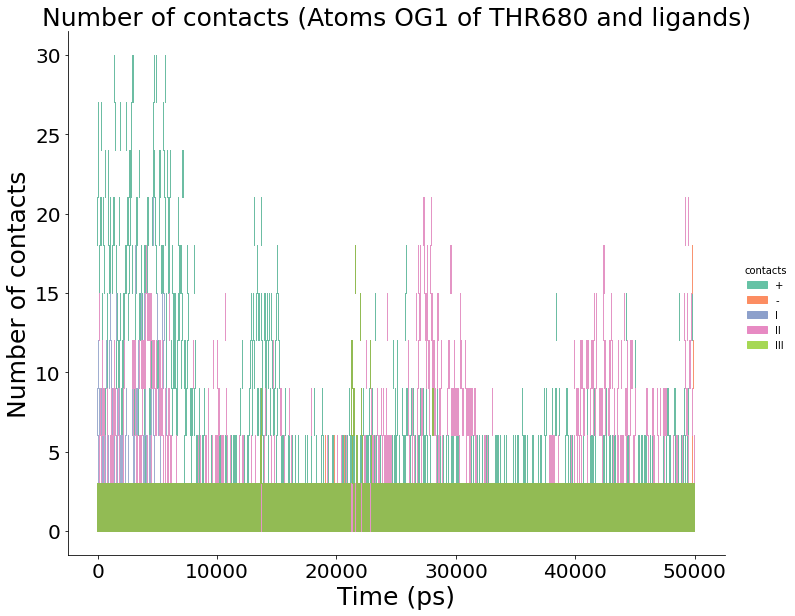

In [135]:
fig = plt.figure(figsize=[10,8],dpi=300)
sns.displot(x='Time',y='vals',data=T680_contact_melt,hue='contacts',palette='Set2',binwidth=3,height=8,aspect=1.25)
plt.xlabel("Time (ps)",fontsize=25)
plt.ylabel("Number of contacts",fontsize=25)
plt.title('Number of contacts (Atoms OG1 of THR680 and ligands)',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()

#fig.savefig('hbond.png',dpi=300)

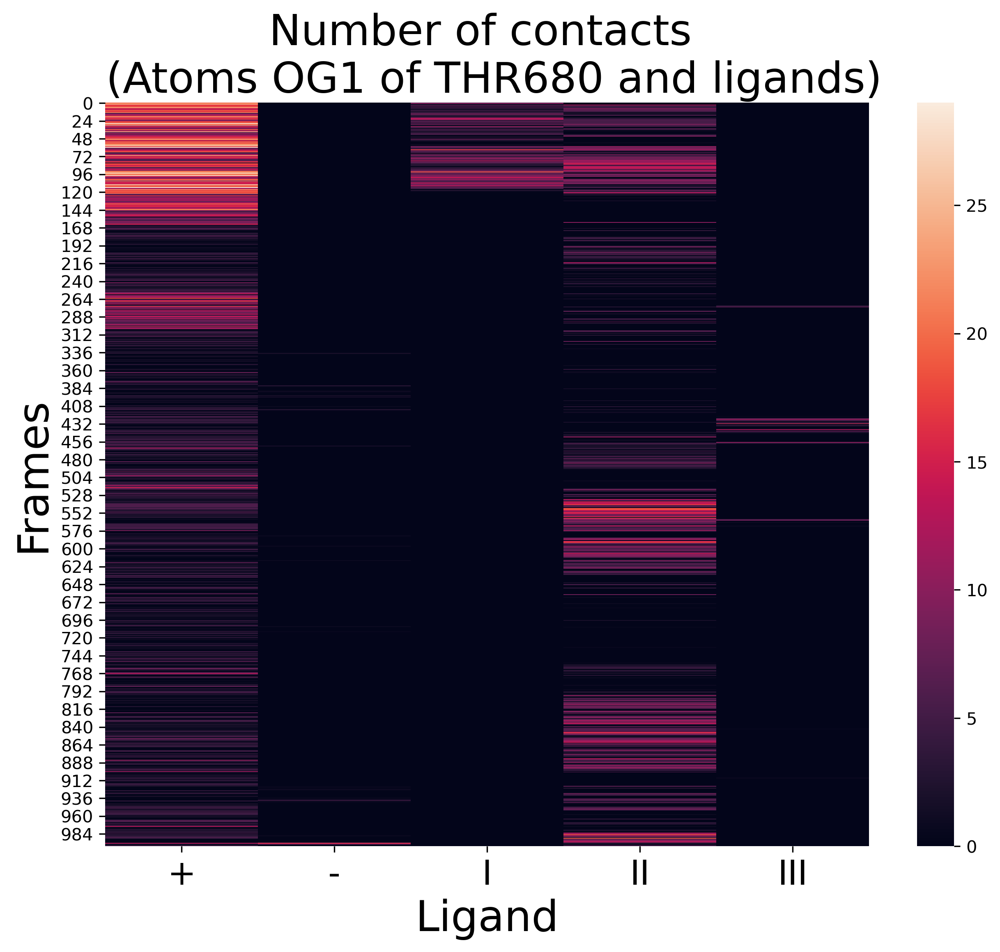

In [136]:
fig = plt.figure(figsize=[10,8],dpi=300)

sns.heatmap(T680_contact.loc[:,['+','-','I','II','III']])
plt.tick_params(axis='x',which='both',labelsize=25)
plt.ylabel("Frames",fontsize=25)
plt.xlabel("Ligand",fontsize=25)
plt.title('Number of contacts \n (Atoms OG1 of THR680 and ligands)',fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=10)
plt.show()
fig.savefig('THR680cont.png',dpi=300)

## Equilibration graphs

In [102]:
##Energy minimization
em_xtal=pd.read_csv('emplot_xtal.csv',index_col=0)
em_lig1=pd.read_csv('emplot_lig1.csv',index_col=0)
em_lig2=pd.read_csv('emplot_lig2.csv',index_col=0)
em_lig3=pd.read_csv('emplot_lig3.csv',index_col=0)
em_decoy=pd.read_csv('emplot_decoy.csv',index_col=0)

##Equilibration temperature
EqT_xtal=pd.read_csv('temperaeq_xtal.csv',index_col=0)
EqT_lig1=pd.read_csv('temperaeq_lig1.csv',index_col=0)
EqT_lig2=pd.read_csv('temperaeq_lig2.csv',index_col=0)
EqT_lig3=pd.read_csv('temperaeq_lig3.csv',index_col=0)
EqT_decoy=pd.read_csv('temperaeq_decoy.csv',index_col=0)

##Equilibration pressure
EqP_xtal=pd.read_csv('pressureeq_xtal.csv',index_col=0)
EqP_lig1=pd.read_csv('pressureeq_lig1.csv',index_col=0)
EqP_lig2=pd.read_csv('pressureeq_lig2.csv',index_col=0)
EqP_lig3=pd.read_csv('pressureeq_lig3.csv',index_col=0)
EqP_decoy=pd.read_csv('pressureeq_decoy.csv',index_col=0)

##Production density
rhopro_xtal=pd.read_csv('density_xtal.csv',index_col=0)
rhopro_lig1=pd.read_csv('density_lig1.csv',index_col=0)
rhopro_lig2=pd.read_csv('density_lig2.csv',index_col=0)
rhopro_lig3=pd.read_csv('density_lig3.csv',index_col=0)
rhopro_decoy=pd.read_csv('density_decoy.csv',index_col=0)

##Autocorrelation function
autocorr_xtal=pd.read_csv('autocorr_xtal.csv',index_col=0)
autocorr_lig1=pd.read_csv('autocorr_lig1.csv',index_col=0)
autocorr_lig2=pd.read_csv('autocorr_lig2.csv',index_col=0)
autocorr_lig3=pd.read_csv('autocorr_lig3.csv',index_col=0)
autocorr_decoy=pd.read_csv('autocorr_decoy.csv',index_col=0)

##RMSF
rmsf_xtal=pd.read_csv('rmsf_xtal.csv',index_col=0)
rmsf_lig1=pd.read_csv('rmsf_lig1.csv',index_col=0)
rmsf_lig2=pd.read_csv('rmsf_lig2.csv',index_col=0)
rmsf_lig3=pd.read_csv('rmsf_lig3.csv',index_col=0)
rmsf_decoy=pd.read_csv('rmsf_decoy.csv',index_col=0)

In [103]:
##Energy minimization

em_total=pd.DataFrame([em_lig1['Step'],em_xtal['em_xtal'],em_decoy['em_decoy'],em_lig1['em_lig1'],
                         em_lig2['em_lig2'],em_lig3['em_lig3']])
em_total=em_total.T
em_total.fillna(method='ffill',inplace=True)
em_total

,Step,em_xtal,em_decoy,em_lig1,em_lig2,em_lig3
0,0.0,3.208843e+09,3.209570e+09,3.209368e+09,3.209264e+09,3.209127e+09
1,1.0,2.177877e+08,2.178637e+08,2.178208e+08,2.178462e+08,2.178050e+08
2,2.0,5.148840e+07,5.152264e+07,5.150288e+07,5.151814e+07,5.149461e+07
3,3.0,7.734061e+06,7.748462e+06,7.734359e+06,7.744994e+06,7.733289e+06
4,4.0,-1.762128e+05,-1.667405e+05,-1.785400e+05,-1.700243e+05,-1.783456e+05
...,...,...,...,...,...,...
2170,2741.0,-4.112497e+06,-4.117657e+06,-4.122342e+06,-4.112690e+06,-4.113999e+06
2171,2742.0,-4.112497e+06,-4.117657e+06,-4.122345e+06,-4.112690e+06,-4.113999e+06
2172,2743.0,-4.112497e+06,-4.117657e+06,-4.122360e+06,-4.112690e+06,-4.113999e+06
2173,2744.0,-4.112497e+06,-4.117657e+06,-4.122377e+06,-4.112690e+06,-4.113999e+06


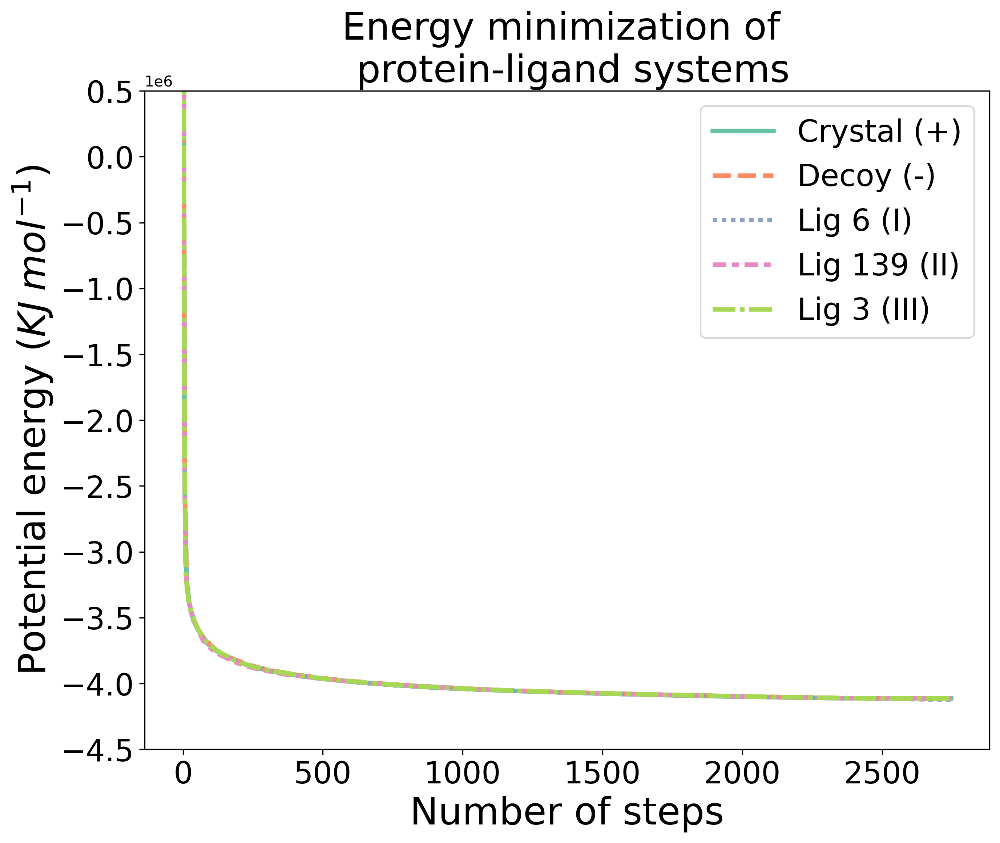

In [104]:
##Plot em minimization

fig = plt.figure(figsize=[10,8],dpi=300)


#ligtaver=ligrmsd.T[['rmsd_xtallig','rmsd_decoylig','rmsd_liglig1','rmsd_liglig2','rmsd_liglig3']].rolling(window=50).mean()
#ligtaver['time']=ligrmsd.T['time']
#ligtaver_df=ligtaver.melt('time',var_name='rmsd',value_name='vals_aver')
#sns.lineplot(x='time',y='vals_aver',data=ligtaver_df,hue='rmsd',palette='Set2',linewidth=3)

em_total_melted=em_total.melt('Step',var_name='em',value_name='vals')
sns.lineplot(x='Step',y='vals',data=em_total_melted,hue='em',palette='Set2',linewidth=3,style='em')

plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=20)

plt.ylabel("Potential energy ($KJ\;mol^{-1}$)",fontsize=25)
plt.xlabel("Number of steps",fontsize=25)
plt.title('Energy minimization of \n protein-ligand systems',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.ylim(-4.5e+06,0.5e+06)
plt.yticks(np.arange(-4.5e+06,1.0e+06,500000))
plt.show()
fig.savefig('emtot.png',dpi=300)

In [105]:
##Equilibration temperature

eqT_total=pd.DataFrame([EqT_xtal['time'],EqT_xtal['Teq_xtal'],EqT_decoy['Teq_decoy'],EqT_lig1['Teq_lig1'],
                         EqT_lig2['Teq_lig2'],EqT_lig3['Teq_lig3']])
eqT_total=eqT_total.T
eqT_total

,time,Teq_xtal,Teq_decoy,Teq_lig1,Teq_lig2,Teq_lig3
0,0.0,310.703613,309.380188,310.166962,309.803986,310.361237
1,1.0,304.041687,303.144592,303.484650,304.442505,302.211365
2,2.0,309.735077,307.682678,309.075775,309.677551,308.248657
3,3.0,309.321320,310.266876,309.616760,309.263885,310.406250
4,4.0,308.573395,309.595337,310.352936,309.683197,309.453979
...,...,...,...,...,...,...
96,96.0,309.716949,309.743927,309.861786,310.569336,309.690918
97,97.0,310.059662,309.067108,309.749176,309.219971,309.199860
98,98.0,309.907043,311.822083,310.424072,310.063354,310.031860
99,99.0,309.867218,310.607971,310.281769,309.779266,310.287750


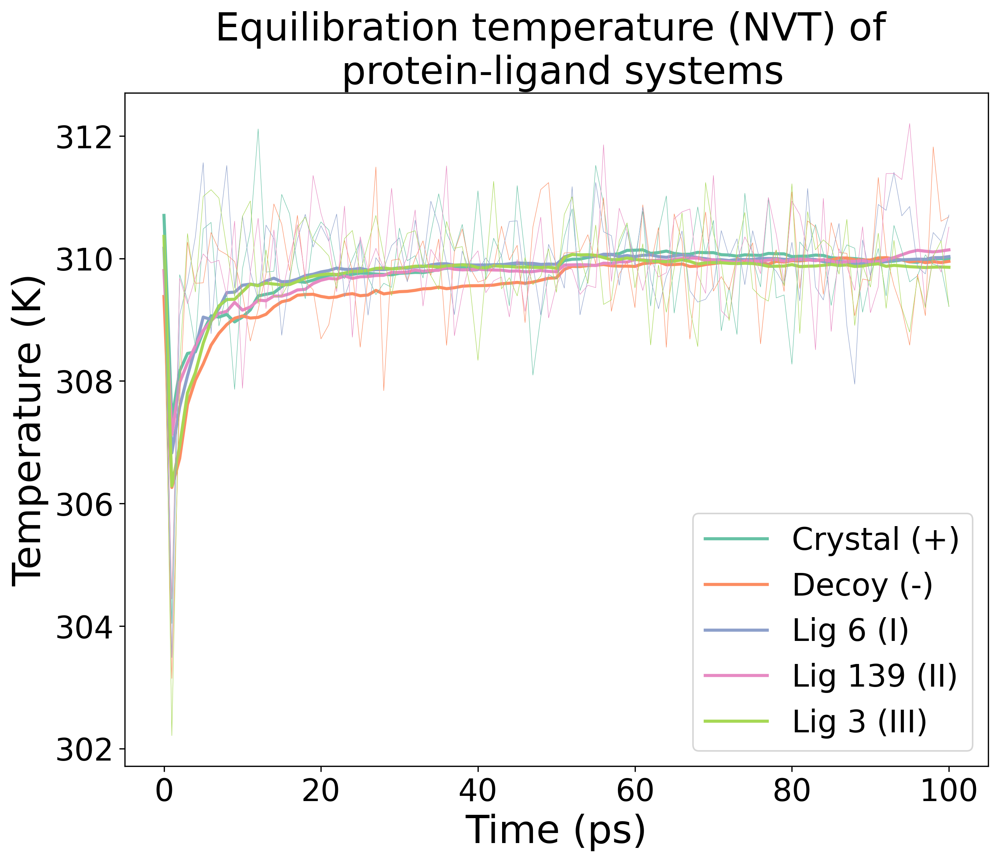

In [106]:
##Plot equilibration temperature 

fig = plt.figure(figsize=[10,8],dpi=300)


eqT_totalaver=eqT_total[['Teq_xtal','Teq_decoy','Teq_lig1','Teq_lig2','Teq_lig3']].rolling(window=50,min_periods=1).mean()
eqT_totalaver['time']=eqT_total['time']
eqT_totalaver_df=eqT_totalaver.melt('time',var_name='Teq',value_name='vals_aver')
sns.lineplot(x='time',y='vals_aver',data=eqT_totalaver_df,hue='Teq',palette='Set2',linewidth=2)

eqT_total_melted=eqT_total.melt('time',var_name='Teq',value_name='vals')
sns.lineplot(x='time',y='vals',data=eqT_total_melted,hue='Teq',palette='Set2',linewidth=0.3)

plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=20)

plt.ylabel("Temperature (K)",fontsize=25)
plt.xlabel("Time (ps)",fontsize=25)
plt.title('Equilibration temperature (NVT) of \n protein-ligand systems',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()
fig.savefig('Tequi.png',dpi=300)

In [107]:
##Equilibration pressure

eqP_total=pd.DataFrame([EqP_xtal['time'],EqP_xtal['Peq_xtal'],EqP_decoy['Peq_decoy'],EqP_lig1['Peq_lig1'],
                         EqP_lig2['Peq_lig2'],EqP_lig3['Peq_lig3']])
eqP_total=eqP_total.T
eqP_total

,time,Peq_xtal,Peq_decoy,Peq_lig1,Peq_lig2,Peq_lig3
0,0.0,70.008240,114.724274,24.721832,133.601898,78.681229
1,1.0,17.737839,29.775879,72.171234,4.223190,53.258942
2,2.0,28.731583,9.811142,-13.134888,-4.211044,82.009293
3,3.0,-87.177734,-87.656311,50.358887,37.618149,61.415390
4,4.0,8.017792,93.473862,16.751846,14.121292,-34.935753
...,...,...,...,...,...,...
96,96.0,-11.636703,-7.621964,8.397034,39.146576,-52.152512
97,97.0,12.544357,37.387802,-18.881165,-84.114304,14.843399
98,98.0,-57.459358,6.950424,80.967407,-62.083260,-45.271690
99,99.0,2.626846,22.949738,-48.195793,19.562866,44.452423


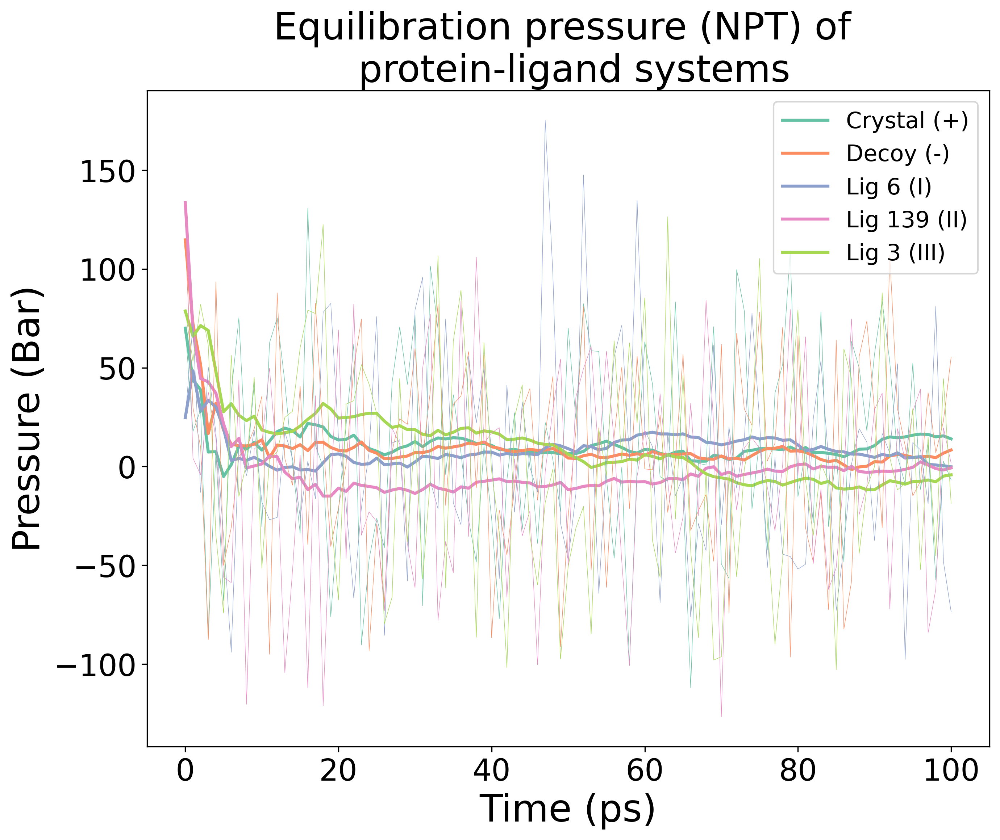

In [108]:
##Plot equilibration pressure 

fig = plt.figure(figsize=[10,8],dpi=300)


eqP_totalaver=eqP_total[['Peq_xtal','Peq_decoy','Peq_lig1','Peq_lig2','Peq_lig3']].rolling(window=50,min_periods=1).mean()
eqP_totalaver['time']=eqP_total['time']
eqP_totalaver_df=eqP_totalaver.melt('time',var_name='Peq',value_name='vals_aver')
sns.lineplot(x='time',y='vals_aver',data=eqP_totalaver_df,hue='Peq',palette='Set2',linewidth=2)

eqP_total_melted=eqP_total.melt('time',var_name='Peq',value_name='vals')
sns.lineplot(x='time',y='vals',data=eqP_total_melted,hue='Peq',palette='Set2',linewidth=0.3)

plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=15)

plt.ylabel("Pressure (Bar)",fontsize=25)
plt.xlabel("Time (ps)",fontsize=25)
plt.title('Equilibration pressure (NPT) of \n protein-ligand systems',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()
fig.savefig('Pequi.png',dpi=300)

In [109]:
##Production density

rhopro_total=pd.DataFrame([rhopro_xtal['time'],rhopro_xtal['rhoeq_xtal'],rhopro_decoy['rhoeq_decoy'],rhopro_lig1['rhoeq_lig1'],
                         rhopro_lig2['rhoeq_lig2'],rhopro_lig3['rhoeq_lig3']])
rhopro_total=rhopro_total.T
rhopro_total

,time,rhoeq_xtal,rhoeq_decoy,rhoeq_lig1,rhoeq_lig2,rhoeq_lig3
0,0.0,995.150208,993.976257,994.388367,995.347351,994.700623
1,2.0,994.866272,993.714050,994.170349,995.184998,994.511108
2,4.0,994.275635,993.644409,993.612671,994.886169,994.260071
3,6.0,993.724426,993.812988,992.846863,994.204163,994.030701
4,8.0,993.215332,994.110657,992.332031,993.309631,993.806641
...,...,...,...,...,...,...
24996,49992.0,995.654846,994.183777,994.934265,995.439026,995.802490
24997,49994.0,995.388733,993.527710,995.532349,995.177917,996.293579
24998,49996.0,994.595825,992.880554,995.711792,994.504822,996.056274
24999,49998.0,993.605103,992.565613,995.192688,993.860474,995.273010


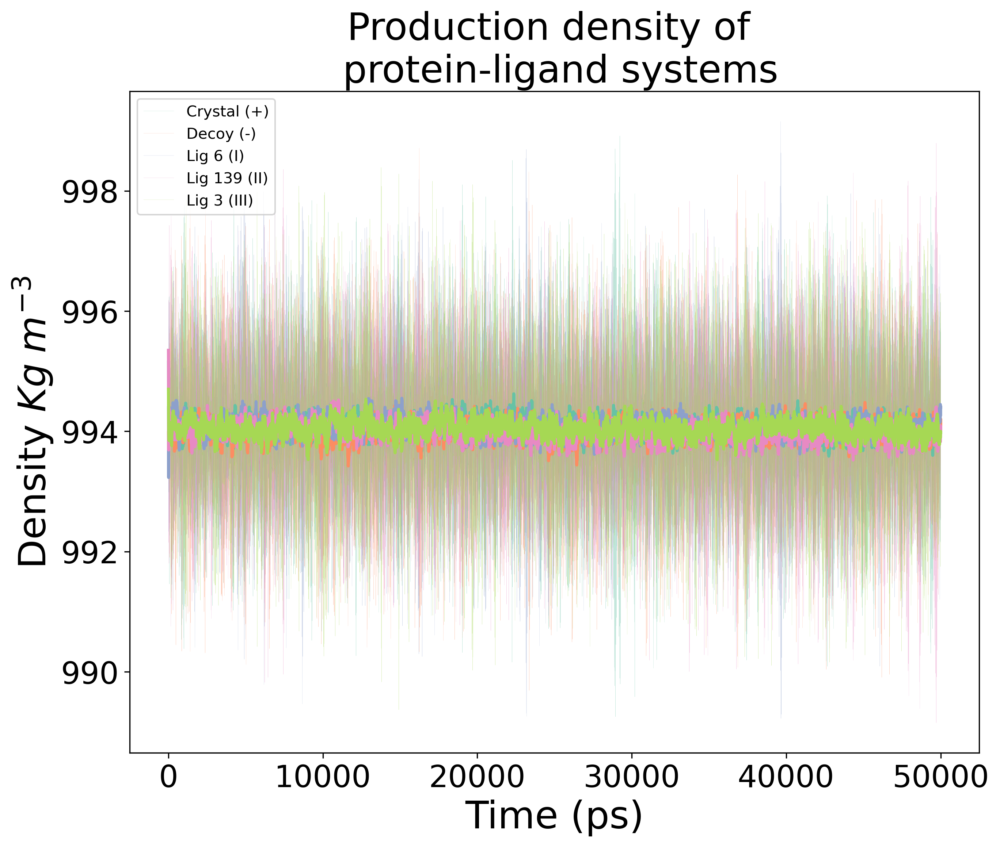

In [110]:
##Plot production density

fig = plt.figure(figsize=[10,8],dpi=300)


rhopro_total_melted=rhopro_total.melt('time',var_name='rho',value_name='vals')
sns.lineplot(x='time',y='vals',data=rhopro_total_melted,hue='rho',palette='Set2',linewidth=0.05)


rhopro_totalaver=rhopro_total[['rhoeq_xtal','rhoeq_decoy','rhoeq_lig1','rhoeq_lig2','rhoeq_lig3']].rolling(window=50,min_periods=1).mean()
rhopro_totalaver['time']=rhopro_total['time']
rhopro_totalaver_df=rhopro_totalaver.melt('time',var_name='rho',value_name='vals_aver')
sns.lineplot(x='time',y='vals_aver',data=rhopro_totalaver_df,hue='rho',palette='Set2',linewidth=2)

plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=10)

plt.ylabel("Density $Kg\;m^{-3}$",fontsize=25)
plt.xlabel("Time (ps)",fontsize=25)
plt.title('Production density of \n protein-ligand systems',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()
fig.savefig('rhopro.png',dpi=300)

In [111]:
##Autocorrelation function

autocorr_total=pd.DataFrame([autocorr_xtal['time'],autocorr_xtal['c(t)_xtal'],autocorr_decoy['c(t)_decoy'],autocorr_lig1['c(t)_lig1'],
                         autocorr_lig2['c(t)_lig2'],autocorr_lig3['c(t)_lig3']])
autocorr_total=autocorr_total.T
autocorr_total

,time,c(t)_xtal,c(t)_decoy,c(t)_lig1,c(t)_lig2,c(t)_lig3
0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000
1,50.0,0.922978,0.763795,0.827257,0.697454,0.785091
2,100.0,0.897811,0.707549,0.794356,0.641866,0.757174
3,150.0,0.878357,0.671076,0.756648,0.578153,0.735839
4,200.0,0.861356,0.656305,0.744097,0.581276,0.703808
...,...,...,...,...,...,...
996,49800.0,-0.005095,0.002289,-0.010402,-0.000755,-0.000742
997,49850.0,-0.003848,0.001406,-0.009697,-0.001129,0.000460
998,49900.0,-0.002535,0.001582,-0.006911,-0.002366,0.000166
999,49950.0,-0.002235,-0.001451,-0.006752,-0.002291,0.000383


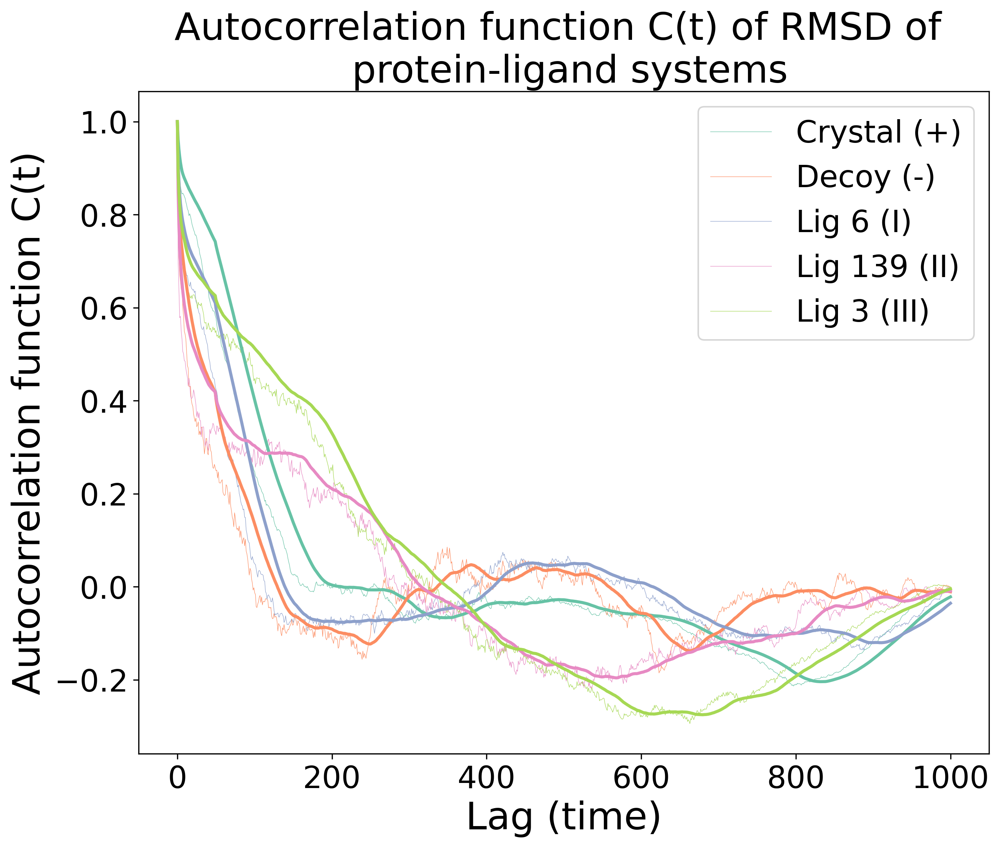

In [124]:
##Plot autocorrelation function

fig = plt.figure(figsize=[10,8],dpi=300)

autocorr_total['time']=np.arange(0,1001,1)

autocorr_total_melted=autocorr_total.melt('time',var_name='corr',value_name='vals')

sns.lineplot(x='time',y='vals',data=autocorr_total_melted,hue='corr',palette='Set2',linewidth=0.3)

autocorr_totalaver=autocorr_total[['c(t)_xtal','c(t)_decoy','c(t)_lig1','c(t)_lig2','c(t)_lig3']].rolling(window=50,min_periods=1).mean()
autocorr_totalaver['time']=np.arange(0,1001,1)
autocorr_totalaver_df=autocorr_totalaver.melt('time',var_name='corr',value_name='vals_aver')
sns.lineplot(x='time',y='vals_aver',data=autocorr_totalaver_df,hue='corr',palette='Set2',linewidth=2)

plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=20)

plt.ylabel("Autocorrelation function C(t)",fontsize=25)
plt.xlabel("Lag (time)",fontsize=25)
plt.title('Autocorrelation function C(t) of RMSD of \n protein-ligand systems',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()
fig.savefig('autocorr.png',dpi=300)

In [119]:
autocorr_total_melted

,time,corr,vals
0,0.0,c(t)_xtal,1.000000
1,50.0,c(t)_xtal,0.922978
2,100.0,c(t)_xtal,0.897811
3,150.0,c(t)_xtal,0.878357
4,200.0,c(t)_xtal,0.861356
...,...,...,...
5000,49800.0,c(t)_lig3,-0.000742
5001,49850.0,c(t)_lig3,0.000460
5002,49900.0,c(t)_lig3,0.000166
5003,49950.0,c(t)_lig3,0.000383


In [113]:
##RMSF

rmsf_total=pd.DataFrame([rmsf_xtal['res_num'],rmsf_xtal['rmsf_xtal'],rmsf_decoy['rmsf_decoy'],rmsf_lig1['rmsf_lig1'],
                         rmsf_lig2['rmsf_lig2'],rmsf_lig3['rmsf_lig3']])
rmsf_total=rmsf_total.T
rmsf_total

,res_num,rmsf_xtal,rmsf_decoy,rmsf_lig1,rmsf_lig2,rmsf_lig3
0,17.0,22.644651,31.720084,20.977949,32.616963,20.334641
1,18.0,21.850821,30.599763,20.835646,30.633818,19.866870
2,19.0,22.238831,28.516768,20.842912,29.711225,19.784664
3,20.0,21.198652,29.172574,21.831751,29.903904,20.201272
4,21.0,21.148404,29.089557,22.652364,30.069624,20.519010
...,...,...,...,...,...,...
890,907.0,27.681888,15.009457,17.045378,31.566626,19.498317
891,908.0,28.579348,15.200645,18.016967,32.056406,20.023689
892,909.0,30.628257,15.749617,18.681753,33.517506,20.577946
893,910.0,30.754349,16.040793,18.773519,33.934232,20.427888


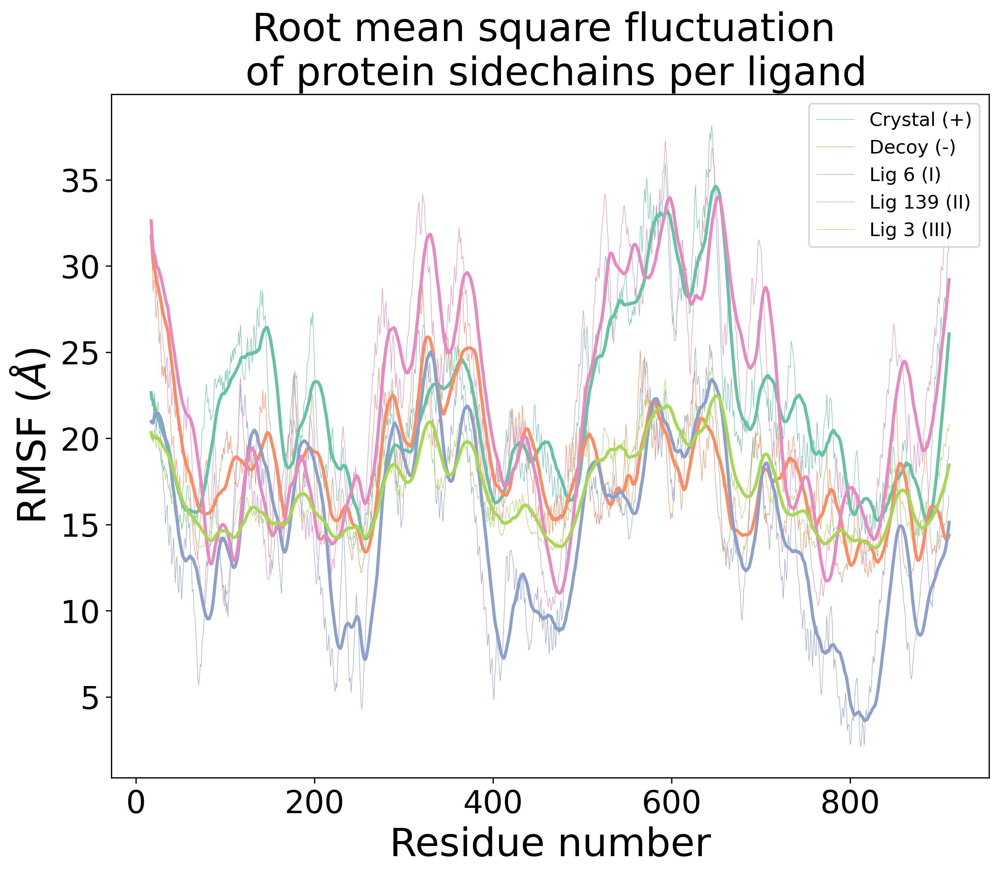

In [114]:
##Plot RMSF

fig = plt.figure(figsize=[10,8],dpi=300)


rmsf_total_melted=rmsf_total.melt('res_num',var_name='rmsf',value_name='vals')
sns.lineplot(x='res_num',y='vals',data=rmsf_total_melted,hue='rmsf',palette='Set2',linewidth=0.3)

rmsf_totalaver=rmsf_total[['rmsf_xtal','rmsf_decoy','rmsf_lig1','rmsf_lig2','rmsf_lig3']].rolling(window=20,min_periods=1).mean()
rmsf_totalaver['res_num']=rmsf_total['res_num']
rmsf_totalaver_df=rmsf_totalaver.melt('res_num',var_name='rmsf',value_name='vals_aver')
sns.lineplot(x='res_num',y='vals_aver',data=rmsf_totalaver_df,hue='rmsf',palette='Set2',linewidth=2)

plt.legend(labels=['Crystal (+)','Decoy (-)','Lig 6 (I)','Lig 139 (II)','Lig 3 (III)'],loc='best',fontsize=12)

plt.ylabel("RMSF ($\AA$)",fontsize=25)
plt.xlabel("Residue number",fontsize=25)
plt.title('Root mean square fluctuation \n of protein sidechains per ligand',
          fontsize=25)
plt.tick_params(axis='x',labelsize=20)
plt.tick_params(axis='y',labelsize=20)
plt.show()
fig.savefig('rmsf.png',dpi=300)
